## Imports

In [2]:
import json

import itertools

import graphviz # External library, <pip install graphviz>
from pylab import *

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns

from sklearn import tree
from sklearn import metrics # for accuracy_score roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

# Data objects

In [3]:
class Champion:
    def __init__(self, champion_id, name, tags):
        self._champion_id = champion_id
        self._name = name
        self._tag = tags[0]

# Utilities
usefull functions that can be reused either for some plots, or minor calculations that are often used in the code

In [4]:
def get_max_index(ls):
    '''
    Returns the max element in a list index
    '''
    return max(range(len(ls)), key=ls.__getitem__)


def autolabel(rects, ax, fsize):
    """
    Attach a text label above each bar displaying its height
    rects - buckets/bars of bar plot
    ax - axis where to plot
    fsize - font size of title and labels
    """
    for rect in rects:
        height = rect.get_height()
        val = float("{0:.2f}".format(height))
        ax.text(rect.get_x() + rect.get_width()/2., 1.05*height,
                val,
                ha='center', va='bottom', fontsize=fsize)
        
        
def first_objective_taken_count(data, col, N):
    '''
    Returns the percentage of winning the game if the team took objective 'col' first
    data - dataframe containing game data
    col - attribute name
    N - Total sample amount
    '''
    df = (data[(data[col] == 1) & (data['winner'] == 1)].count() + data[(data[col] == 2) & (data['winner'] == 2)].count())
    return df[col]/N * 100


def total_objective_taken_count(data, col, count):
    '''
    Returns the percentage of winning the game if 'count' amount of objective was taken
    We are looking at if a team took 'count' amount of objectives, what percent of overall games did they win then when
    col - attribute name
    N - Total sample amount
    '''
    T1 = 't1_'+col
    T2 = 't2_'+col
    
    N = len(data.index)
    
    df = (data[(data[T1] == count) & (data['winner'] == 1)].count() + data[(data[T2] == count) & (data['winner'] == 2)].count())
    return df['winner']/N *100


def transform_game_duration(duration):
    '''
    Transform the game duration from seconds to minutes
    This is done because random forests have a harder time with continues variables,
    so to increase performance the game duration will be added to buckets of minutes.
    duration - game durations in seconds
    '''
    quotient, remainder = divmod(duration, 60)
    return (quotient + 1) if remainder > 30 else quotient

def get_champions(path):
    '''
    Returns a list of Champion objects which contain the id, name and tags
    '''
    champions = []
    with open(path) as json_file:
        data = json.load(json_file)
        
        for key, value in data['data'].items():
            chp = Champion(value["id"], value["name"], value["tags"])
            champions.append(chp)
    
    return champions


def get_champion_id(champs, champ_name):
    '''Finds and returns the champion id by given champion name'''
    for c in champs:
        if c._name == champ_name:
            return c._champion_id
        
    raise Exception('Champion {} could not be found'.format(champ_name))

    
def get_champion_tag(champs, c_id):
    '''Finds and returns the champion tag by given champion id'''
    tag_codes = {'Fighter':0, 'Mage':1, 'Assassin':2, 'Marksman':3, 'Tank':4, 'Support':5}
    tag = ''
    for c in champs:
        if c._champion_id == c_id:
            tag = c._tag
        
    return tag_codes[tag]
    
    
def get_play_and_win_rate(data, cid):
    '''
    Calculates given champion play rate and win rate
    '''
    N = len(data.index)
    
    df1 = data[(data['t1_champ1id'] == cid) | (data['t1_champ2id'] == cid) | (data['t1_champ3id'] == cid) | 
               (data['t1_champ4id'] == cid) | (data['t1_champ5id'] == cid)]
    play1 = df1.count()['winner']
    win1 = df1[df1['winner'] == 1].count()['winner'] / len(df1.index)
    
    df2 = data[(data['t2_champ1id'] == cid) | (data['t2_champ2id'] == cid) | (data['t2_champ3id'] == cid) | 
               (data['t2_champ4id'] == cid) | (data['t2_champ5id'] == cid)]
    play2 = df2.count()['winner']
    win2 = df2[df2['winner'] == 2].count()['winner'] / len(df2.index)
    
    return (play1+play2)/N*100, (win1+win2)*50 # divide by 50, cause I'm taking the average of both team win rates

# Ploting utilities
Ploting functions that are used more than once, to reduce duplicate code

In [5]:
def pie_chart_of_winners(ax,data, fsize):
    '''
    Plots a pie chart of the game win rate for both teams
    ax - axis where to plot
    data - dataframe containing game data
    fsize - font size of title and labels
    '''
    N = len(data.index)

    T1_df = data[data['winner'] == 1].count() * 100 / N
    T2_df = data[data['winner'] == 2].count() * 100 / N

    T1 = T1_df['winner']
    T2 = T2_df['winner']

    _ , texts, autotexts = ax.pie((T1,T2), labels=["Team 1", "Team 2"], startangle=90, autopct='%1.1f%%')
    ax.set_title("Victory percentage of both teams", fontsize=fsize)
    for (t,a) in (texts, autotexts):
        t.set_fontsize(fsize)
        a.set_fontsize(fsize)
        
        
def histogram_of_game_duration(ax, data, bins, fsize):
    '''
    Plots a histogram of how long the games lasted in seconds
    ax - axis where to plot
    data - dataframe containing game data
    bins - amount of bins to put the game duration
    fsize - font size of title and labels
    '''
    gameDuration_min = data['gameDuration'].min()
    gameDuration_max = data['gameDuration'].max()
    
    counts, bins, patches = ax.hist(data['gameDuration'], bins=bins, facecolor='g', alpha=0.8)
    ax.set_title("Game length distribution", fontsize=fsize)
    ax.set_xlabel("Seconds", fontsize=fsize)
    ax.set_ylabel("Amount of games", fontsize=fsize)
    ax.set_xlim(gameDuration_min, gameDuration_max)
    
    fracs = counts / counts.max() #color code by height, could use any scalar
    norm = colors.Normalize(fracs.min(), fracs.max()) #normalizing data to 0..1 for the full range of the colormap
    
    #Loop through our objects and set the color of each accordingly
    for thisfrac, thispatch in zip(fracs, patches):
        color = plt.cm.viridis(norm(thisfrac))
        thispatch.set_facecolor(color)
        
        
def bar_plot_of_objectives_taken_first(ax, data, fsize, x_ticksize=12):
    '''
    Plots a bar plot of what objective taken has which percentage of winning the game
    ax - axis where to plot
    data - dataframe containing game data
    fsize - font size of title and labels
    x_ticksize - size bucket labels
    '''  
    N = len(data.index)
    first_blood = first_objective_taken_count(raw_games_dataframe, 'firstBlood', N)
    first_tower = first_objective_taken_count(raw_games_dataframe, 'firstTower', N)
    first_inhibitor = first_objective_taken_count(raw_games_dataframe, 'firstInhibitor', N)
    first_baron = first_objective_taken_count(raw_games_dataframe, 'firstBaron', N)
    first_dragon = first_objective_taken_count(raw_games_dataframe, 'firstDragon', N)
    first_rift = first_objective_taken_count(raw_games_dataframe, 'firstRiftHerald', N)

    buckets = [first_blood, first_tower, first_inhibitor, first_baron, first_dragon, first_rift]
    labels = ["Blood", "Tower", "Inhibitor", 'Baron', 'Dragon', 'Rift Herald']
    
    rects = ax.bar(np.arange(len(buckets)), buckets, align='center')
    ax.set_xticklabels(labels, fontsize=x_ticksize)
    ax.set_xticks(np.arange(len(buckets)))
    ax.set_ylim(0,100)
    ax.set_ylabel("Percentage(%)", fontsize=fsize)
    ax.set_xlabel("Objective taken first by winning team", fontsize=fsize)
    ax.set_title("Winning probability if a team took objective first", fontsize=fsize)
    autolabel(rects, ax, fsize)
    

def bar_plot_of_total_objectives_taken(ax, data, col, label, title, max_count, fsize, x_ticksize=12):
    '''
    Plots a bar plot of what is the chance of winning the game if x amount of objectives 'col' is taken
    ax - axis where to plot
    data - dataframe containing game data
    col - attribute name
    labels - the name of the objective to be shown in the plot
    title - title of the plot
    fsize - font size of title and labels
    x_ticksize - size bucket labels
    '''
    labels = [str(i) + label for i in range(max_count)]
    buckets = []

    for i in range(max_count):
        bucket = total_objective_taken_count(data, col, i)
        buckets.append(bucket)
        
    rects = ax.bar(np.arange(len(buckets)), buckets, align='center')
    ax.set_xticklabels(labels, fontsize=x_ticksize)
    ax.set_xticks(np.arange(len(buckets)))
    
    ymin, ymax = ax.get_ylim()
    ax.set_ylim(ymin, ymax+8.0)
    
    ax.set_ylabel("Percentage(%)", fontsize=fsize)
    ax.set_xlabel("Objective amount taken", fontsize=fsize)
    ax.set_title(title, fontsize=fsize)
    autolabel(rects, ax, fsize)

def bar_plot_of_champion_rate(ax, buckets, labels, title, fsize, x_ticksize=12):
    '''
    Plots the rate of champion play/win rate
    ax - axis where to plot
    buckets - list containing percentages
    labels - the name of the objective to be shown in the plot
    title - title of the plot
    fsize - font size of title and labels
    x_ticksize - size bucket labels
    '''
    rects = ax.bar(np.arange(len(buckets)), buckets, align='center')
    ax.set_xticklabels(labels, fontsize=x_ticksize)
    ax.set_xticks(np.arange(len(buckets)))
    
    ymin, ymax = ax.get_ylim()
    ax.set_ylim(ymin, ymax+3.0)
    
    ax.set_ylabel("Percentage(%)", fontsize=fsize)
    ax.set_xlabel("Champion", fontsize=fsize)
    ax.set_title(title, fontsize=fsize)
    autolabel(rects, ax, fsize)
    
def plot_classifier_accuracy(ax, X, Y_list, legend, x_label, y_label, title, fsize):
    '''
    Plots a line plot of classifiers accuracy
    X - parameter values
    Y_list - list of classifier accuracy list
    legend - lsit of classifier legend identifiers
    x_label - label of x axis
    y_label - label of y axis
    title - title of the plot
    fsize - font size of title and labels
    '''
    cmap = itertools.cycle('bgrcmk')
    
    for i in range(len(Y_list)):
         ax.plot(X, Y_list[i], color=next(cmap), marker='o', linestyle='dashed')
    
    ax.set_ylabel(y_label, fontsize=fsize)
    ax.set_xlabel(x_label, fontsize=fsize)
    ax.set_title(title, fontsize=fsize)
    ax.legend(legend, prop={'size': fsize-4})
    ax.tick_params(axis='both', which='major', labelsize=fsize-4)

# 1.Data Analysis

##  1.1           Loading data frame
We load our data frame and look at the sample to see what we are dealing with.

In [6]:
raw_games_dataframe = pd.read_csv("Data/games.csv")
print(raw_games_dataframe.columns)
raw_games_dataframe.head()

Index(['gameId', 'creationTime', 'gameDuration', 'seasonId', 'winner',
       'firstBlood', 'firstTower', 'firstInhibitor', 'firstBaron',
       'firstDragon', 'firstRiftHerald', 't1_champ1id', 't1_champ1_sum1',
       't1_champ1_sum2', 't1_champ2id', 't1_champ2_sum1', 't1_champ2_sum2',
       't1_champ3id', 't1_champ3_sum1', 't1_champ3_sum2', 't1_champ4id',
       't1_champ4_sum1', 't1_champ4_sum2', 't1_champ5id', 't1_champ5_sum1',
       't1_champ5_sum2', 't1_towerKills', 't1_inhibitorKills', 't1_baronKills',
       't1_dragonKills', 't1_riftHeraldKills', 't1_ban1', 't1_ban2', 't1_ban3',
       't1_ban4', 't1_ban5', 't2_champ1id', 't2_champ1_sum1', 't2_champ1_sum2',
       't2_champ2id', 't2_champ2_sum1', 't2_champ2_sum2', 't2_champ3id',
       't2_champ3_sum1', 't2_champ3_sum2', 't2_champ4id', 't2_champ4_sum1',
       't2_champ4_sum2', 't2_champ5id', 't2_champ5_sum1', 't2_champ5_sum2',
       't2_towerKills', 't2_inhibitorKills', 't2_baronKills', 't2_dragonKills',
       't2_riftHer

,gameId,creationTime,gameDuration,seasonId,winner,firstBlood,firstTower,firstInhibitor,firstBaron,firstDragon,...,t2_towerKills,t2_inhibitorKills,t2_baronKills,t2_dragonKills,t2_riftHeraldKills,t2_ban1,t2_ban2,t2_ban3,t2_ban4,t2_ban5
0,3326086514,1504279457970,1949,9,1,2,1,1,1,1,...,5,0,0,1,1,114,67,43,16,51
1,3229566029,1497848803862,1851,9,1,1,1,1,0,1,...,2,0,0,0,0,11,67,238,51,420
2,3327363504,1504360103310,1493,9,1,2,1,1,1,2,...,2,0,0,1,0,157,238,121,57,28
3,3326856598,1504348503996,1758,9,1,1,1,1,1,1,...,0,0,0,0,0,164,18,141,40,51
4,3330080762,1504554410899,2094,9,1,2,1,1,1,1,...,3,0,0,1,0,86,11,201,122,18


## 1.2 Plotting uncleaned data
Plotting to take a better look at the data. It'll also help to see if there are any outliers. While plotting the **overall objectives taken by a team**, we should look at the bar percentages relatively because the formula I'm using is **objectives taken by the team who won divided by the total games played**

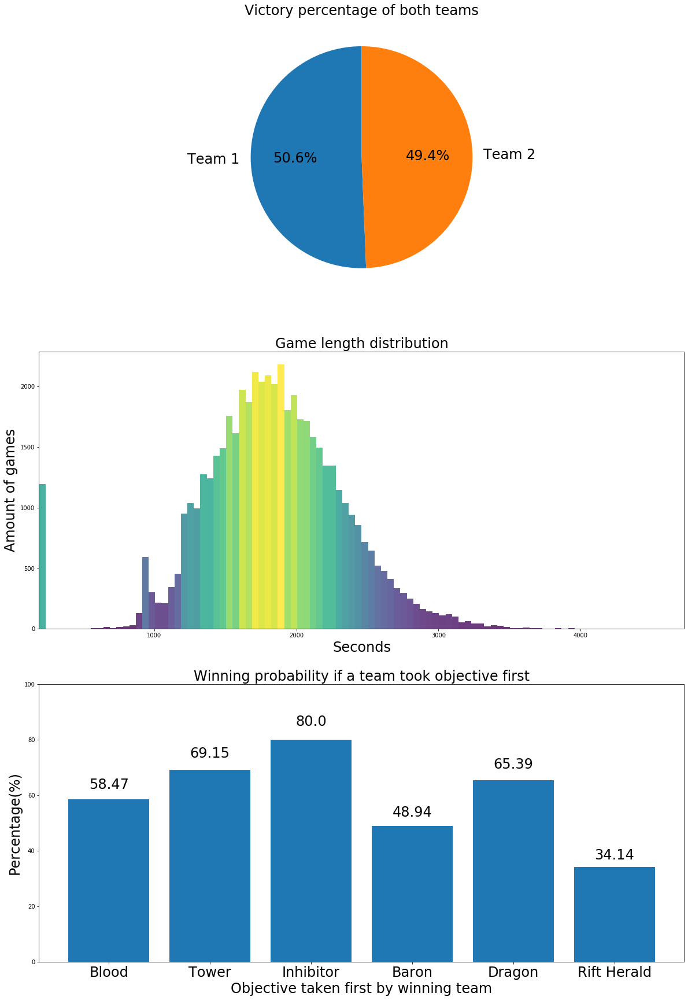

In [7]:
fig, ax = plt.subplots(3,1, figsize=(20,30))
text_fontsize = 24
    
pie_chart_of_winners(ax[0], raw_games_dataframe, text_fontsize)
histogram_of_game_duration(ax[1], raw_games_dataframe, 100, text_fontsize)
bar_plot_of_objectives_taken_first(ax[2], raw_games_dataframe, text_fontsize, text_fontsize)

### Findings

#### First graph
+ We can see that the distribution of winning the game if quite even for both sides.


#### Second graph 
+ The graph shows that there is somewhat of normal distribution for the game length. But there are some outliers. Usually the game rarely ends before 15 or even 20 minutes. This usually happens when one team completely destroys the other one, that way the objectives don't really have time to have that big of impact. The first forfeit is allowed at 15 minutes, but has to be unanimous, all 5 players must agree to surrender. The second forfeit is allowed at 20 minutes, which requires 4/5 to surrender. We could remove games definitely till 15 minutes or even till 20 minutes, because they are more determined by how good each player is with their champion individually and not how well they play as a team and focus objectives.
+ We could also remove games that last more than 50 minutes, because at that point one fight decides the game, meaning if one team was getting butchered but managed to survive till ~50 minutes, if they win one good fight, they win the game. Though this part is debatable, because objectives like baron and dragon at that point give very significant buffs, that are completely game turning. So to be more precise, we'll try to do plot the data both ways, looking at the data with 50+ and without


#### Third graph
+ We can see that inhibitor has the highest impact towards winning or losing the game. Makes sence especially if the inhibitor is taken early in the game, the bonuses it gives are overwhelming.
+ It's also visible that neutral objectives(Dragon, Baron, Rift Herald) have an overall lower winning percentage, than taking down the opposing teams objectives.

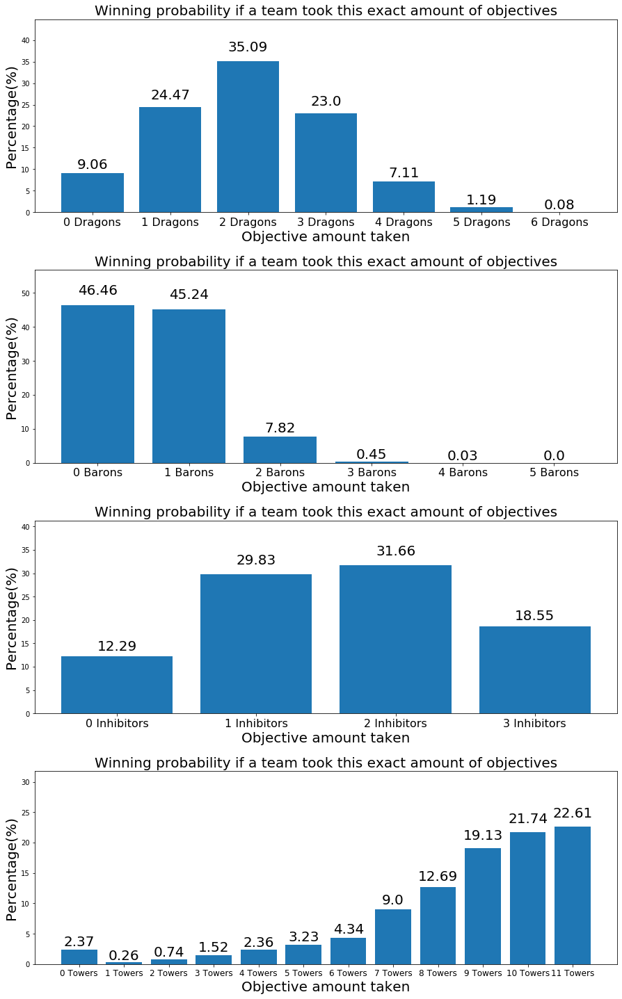

In [8]:
fig, axes = plt.subplots(4,1, figsize = (15, 25))
fig.subplots_adjust(hspace=0.3)
title = "Winning probability if a team took this exact amount of objectives"

#Plot dragons
dragons_taken_max = raw_games_dataframe[['t1_dragonKills', 't2_dragonKills']].max().max() + 1
bar_plot_of_total_objectives_taken(axes[0], raw_games_dataframe, 'dragonKills', ' Dragons', title, dragons_taken_max, 20, 16)

#Plot baron kills
barons_taken_max = raw_games_dataframe[['t1_baronKills', 't2_baronKills']].max().max() + 1
bar_plot_of_total_objectives_taken(axes[1], raw_games_dataframe, 'baronKills', ' Barons', title, barons_taken_max, 20, 16)

#Plot inhibitors
inhibitors_taken_max = 4 # max amount + 1
bar_plot_of_total_objectives_taken(axes[2], raw_games_dataframe, 'inhibitorKills', ' Inhibitors', title, inhibitors_taken_max, 20, 16)

#Plot turrets
tower_taken_max = 12 # max amount + 1
bar_plot_of_total_objectives_taken(axes[3], raw_games_dataframe, 'towerKills', ' Towers', title, tower_taken_max, 20, 12)

### Findings

#### First graph
+ We can see that taking 1-3 dragons per game is the sweet spot for winning the game, taking more results in lower amount of victories because usually the game ends before players get the chance to do so.


#### Second graph 
+ Taking baron gives a significant buff, that should have a bigger impact in winning the game, but here we have a contradiction, teams have a slightly higher chance of winning the game even if they haven't taken baron.
+ But we also see, that when people take the first or second baron they have an enough of advantage to end the game.


#### Third graph
+ 0 Inhibitors taken represents how many games ended in surrendering, since a team cannot win the game otherwise without taking an inhibitor.
+ We can also see that 1-2 inhibitors per game is somewhat enough.

#### Forth graph
+ With towers we see a trend that the more a team takes the better, that does make a lot of sense because by doing so the team opens up the map and gains more control.
+ Though to win a game a team must take at least 5 tower, anything below means on team resulted to surrendering

## 1.3   Ploting clean data

We are going to remove every game before the 18 min mark or 1080s mark, to remove the majority of games that have a very unbalanced player skill level distribution. And make two dataframe splits, one that has 50+ minute games and one that doesn't
+ **cleaned_games_dataframe** - has 45+minute games
+ **cleaned_games_dataframe_trimmed** - has only games up until 45 minutes
And then we'll try to look at cleaned data

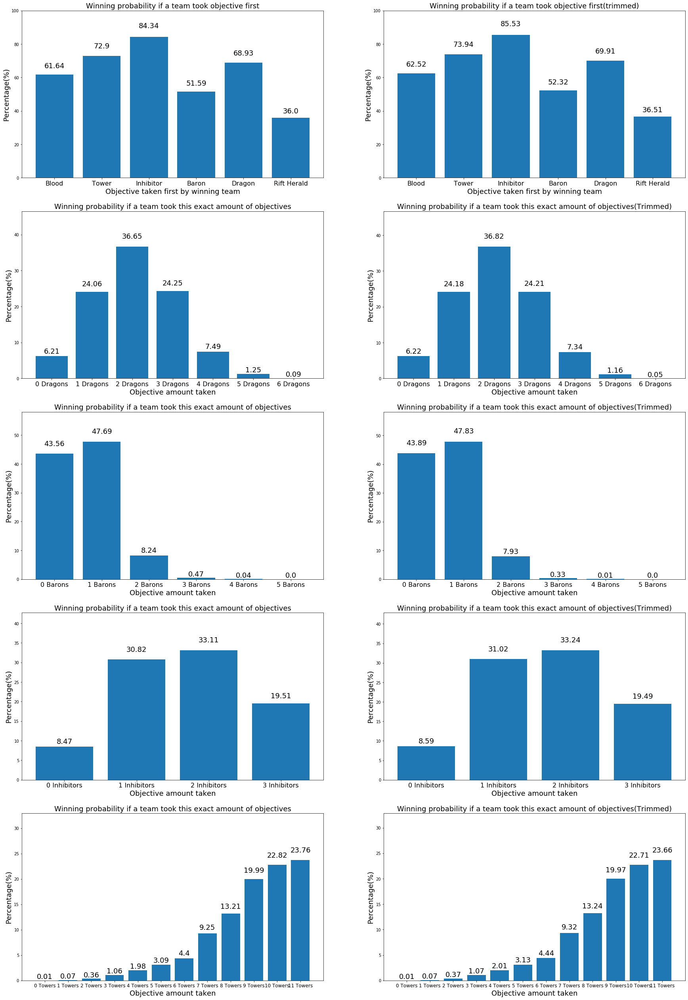

In [9]:
# rounding the gameDuration to minutes to make classifier training easier.
cleaned_games_dataframe = raw_games_dataframe[raw_games_dataframe['gameDuration'] >= 1080]
cleaned_games_dataframe_trimmed = cleaned_games_dataframe[cleaned_games_dataframe['gameDuration'] <= 3000]

fig, axes = plt.subplots(5,2, figsize=(30,45))
text_fontsize = 18
title = "Winning probability if a team took this exact amount of objectives"
title_trimmed = title + "(Trimmed)"

    
# Ploting winning prob if objecti was taken first
bar_plot_of_objectives_taken_first(axes[0][0], cleaned_games_dataframe, text_fontsize, 16)
bar_plot_of_objectives_taken_first(axes[0][1], cleaned_games_dataframe_trimmed, text_fontsize, 16)
axes[0][1].set_title("Winning probability if a team took objective first(trimmed)", fontsize=text_fontsize)

#Plot dragons
bar_plot_of_total_objectives_taken(axes[1][0], cleaned_games_dataframe, 'dragonKills',' Dragons',
                                   title, dragons_taken_max, text_fontsize, 16)

bar_plot_of_total_objectives_taken(axes[1][1], cleaned_games_dataframe_trimmed, 'dragonKills', ' Dragons',
                                   title_trimmed, dragons_taken_max, text_fontsize, 16)


#Plot baron kills
bar_plot_of_total_objectives_taken(axes[2][0], cleaned_games_dataframe, 'baronKills', ' Barons',
                                   title, barons_taken_max, text_fontsize, 16)

bar_plot_of_total_objectives_taken(axes[2][1], cleaned_games_dataframe_trimmed, 'baronKills', ' Barons',
                                   title_trimmed, barons_taken_max, text_fontsize, 16)


#Plot inhibitors
bar_plot_of_total_objectives_taken(axes[3][0], cleaned_games_dataframe, 'inhibitorKills', ' Inhibitors',
                                   title, inhibitors_taken_max, text_fontsize, 16)

bar_plot_of_total_objectives_taken(axes[3][1], cleaned_games_dataframe_trimmed, 'inhibitorKills', ' Inhibitors',
                                   title_trimmed, inhibitors_taken_max, text_fontsize, 16)


#Plot turrets
bar_plot_of_total_objectives_taken(axes[4][0], cleaned_games_dataframe, 'towerKills', ' Towers',
                                   title, tower_taken_max, text_fontsize, 12)
bar_plot_of_total_objectives_taken(axes[4][1], cleaned_games_dataframe_trimmed, 'towerKills', ' Towers',
                                   title_trimmed, tower_taken_max, text_fontsize, 12)

### Findings

#### Graph 1
+ We can see that there is a minor increase in overall importance of neutral objectives, for the cleaned data. We can also see that getting the first inhibitor has even a bigger advantage, that might be the case, because we removed a lot of games that ended in early surrendering to the other team.


#### Graph 2
+ The cleaned graphs have an increase in importance of overall taking dragons. We can see that if a team took 0 dragons the probability it won got reduced. While taking 1-3 increased.


#### Graph 3
+ We can see a change that taking baron now has a higher percentage of winning, but the difference is still not relatively high, this could be because baron is the hardest neutral objective to take. Meaning teams tend to compete for it in the later stages of the game and the longer the game drags out, the more overall games end in surrendering.


#### Graph 4
+ We still see that ~8.47 of games end in surrendering before a team had a chance to take out an inhibitor, which in our opinion is a usually a bit to early.
+ We can also see that overall the chance of winning does increase in taking the inhibitors.


#### Graph 5
+ We can see the same trend as for the other graphs, a slight overall increase.


We can also see that the after 50 minutes the objectives taken early in the game first by a team or overall, don't really have a big impact, because the two plots look very similar, that is because at later stages of the game single-player mistakes cost a team a lot more than losing an objective. Besides that some champions excel at later game stages which also slightly reduces the need for objectives.

# 2.Selecting relative attributes
The data contains a lot of attributes and we don't need all of them. We are going to select 4 different subsets and try to predict if the team with these type of attributes would win or lose the game

## 2.1   Attribute selection reasoning
The data set contains many attributes, we don't need all of them we only need a subset to properly predict the outcome of the game. We can look at it in 4 ways:

1. At first we will only look at subset consisting of what objectives a team took and how did that game end, disregarding what objectives the other team took. This is somewhat an incorrect way to look at this data, because it matters what objectives are taken by the other team. But could be useful to look at and see what subsets tend to end in victory.

2. We'll look at two teams and the objectives those teams took, and we will determine which team won blue or red.

3. Since the champion pool is not crazy high ~135(not all of them are played often) and the data set is 51k samples, we'll try to look at only champions. Because some champions are just a lot better in the game than others, because of the current **meta**(for more info look, the game info doc). Meaning picking them has an impact of winning or losing a game.

4. Lastly we'll look at the combined data set of part 2 and 3, having pretty much all the data that have a major impact on the game outcome, and try to mine the winning rate there as well

Another thing I'd like to understand is what was the meta for that particular season, which type of champion classes were go to, for winning the game, though this is a slightly different problem.

In [10]:
# Select 1 and print sample
copy1_df = cleaned_games_dataframe.copy()

X1 = copy1_df[['gameDuration', 'firstBlood', 'firstTower', 'firstInhibitor', 'firstDragon', 'firstRiftHerald', 'firstBaron',
              't1_towerKills', 't1_inhibitorKills', 't1_baronKills', 't1_dragonKills']]

X1.rename(columns={'t1_towerKills':'towers', 't1_inhibitorKills':'inhibitors',
                   'baronKills':'barons', 't1_dragonKills':'dragons'})

X1['firstBlood'].replace(2,0, inplace=True)
X1['firstTower'].replace(2,0, inplace=True)
X1['firstInhibitor'].replace(2,0, inplace=True)
X1['firstDragon'].replace(2,0, inplace=True)
X1['firstRiftHerald'].replace(2,0, inplace=True)
X1['firstBaron'].replace(2,0, inplace=True)

Y1 = copy1_df['winner'].replace(2,0)
X1.sample(5)

C:\Anaconda3\lib\site-packages\pandas\core\generic.py:6586: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


,gameDuration,firstBlood,firstTower,firstInhibitor,firstDragon,firstRiftHerald,firstBaron,t1_towerKills,t1_inhibitorKills,t1_baronKills,t1_dragonKills
45412,1926,0,1,0,0,0,1,5,0,1,1
33890,1893,0,0,0,1,1,0,3,0,0,1
18335,1856,0,0,0,0,0,0,0,0,0,0
2496,2384,1,1,1,1,0,1,9,1,2,3
38615,2694,1,0,0,1,0,1,8,1,1,2


In [11]:
# Select 2 and print sample
copy2_df = cleaned_games_dataframe.copy()

X2 = copy2_df[['gameDuration', 'firstBlood', 'firstTower', 'firstInhibitor', 'firstDragon', 'firstRiftHerald', 'firstBaron', 
                                 't1_towerKills', 't1_inhibitorKills', 't1_baronKills', 't1_dragonKills',
                                 't2_towerKills', 't2_inhibitorKills', 't2_baronKills', 't2_dragonKills']]
Y2 = copy2_df['winner']

X2.sample(5)

,gameDuration,firstBlood,firstTower,firstInhibitor,firstDragon,firstRiftHerald,firstBaron,t1_towerKills,t1_inhibitorKills,t1_baronKills,t1_dragonKills,t2_towerKills,t2_inhibitorKills,t2_baronKills,t2_dragonKills
37403,2145,2,2,2,2,2,1,5,0,1,1,7,2,0,2
1687,1412,1,1,1,2,0,0,7,1,0,1,0,0,0,1
36332,2014,1,1,1,1,0,0,8,1,0,3,1,0,0,0
15329,2205,1,1,2,2,0,1,7,1,1,2,5,1,1,1
14907,1372,1,1,1,1,0,0,10,2,0,1,1,0,0,0


In [12]:
# Select 3 and print sample
copy3_df = cleaned_games_dataframe.copy()

X3 = copy3_df[['t1_champ1id', 't1_champ2id', 't1_champ3id', 't1_champ4id', 't1_champ5id',
               't2_champ1id', 't2_champ2id', 't2_champ3id', 't2_champ4id', 't2_champ5id']]

Y3 = copy3_df['winner']

X3.sample(5)

,t1_champ1id,t1_champ2id,t1_champ3id,t1_champ4id,t1_champ5id,t2_champ1id,t2_champ2id,t2_champ3id,t2_champ4id,t2_champ5id
31948,236,99,67,80,254,12,96,48,61,23
2707,222,267,58,113,43,103,164,40,51,60
37618,1,119,157,117,141,63,23,67,19,7
43852,41,37,11,45,222,29,1,32,86,432
16781,238,412,254,57,18,222,121,92,117,245


In [13]:
# Select 3 and print sample
copy4_df = cleaned_games_dataframe.copy()

X4 = copy4_df[['gameDuration', 'firstBlood', 'firstTower', 'firstInhibitor', 'firstDragon', 'firstRiftHerald', 'firstBaron', 
                                 't1_towerKills', 't1_inhibitorKills', 't1_baronKills', 't1_dragonKills',
                                 't2_towerKills', 't2_inhibitorKills', 't2_baronKills', 't2_dragonKills',
                                 't1_champ1id', 't1_champ2id', 't1_champ3id', 't1_champ4id', 't1_champ5id',
                                 't2_champ1id', 't2_champ2id', 't2_champ3id', 't2_champ4id', 't2_champ5id']]

Y4 = copy4_df['winner']

X4.sample(5)

,gameDuration,firstBlood,firstTower,firstInhibitor,firstDragon,firstRiftHerald,firstBaron,t1_towerKills,t1_inhibitorKills,t1_baronKills,...,t1_champ1id,t1_champ2id,t1_champ3id,t1_champ4id,t1_champ5id,t2_champ1id,t2_champ2id,t2_champ3id,t2_champ4id,t2_champ5id
25492,1934,1,2,2,2,0,2,5,0,0,...,238,11,21,44,122,98,10,30,24,18
11679,1537,2,1,1,2,1,1,11,3,1,...,222,40,34,421,98,121,59,236,117,96
1696,1806,1,2,2,2,2,2,2,0,0,...,141,157,45,202,44,37,29,111,127,80
50206,2400,1,1,2,1,0,1,4,0,1,...,420,202,412,33,101,90,86,18,89,57
6305,1559,1,2,2,2,2,0,0,0,0,...,21,236,516,412,3,60,84,67,8,40


## 2.2 Taking another peek at the data
Ploting the 3rd segement of data to look at some general tendencies

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


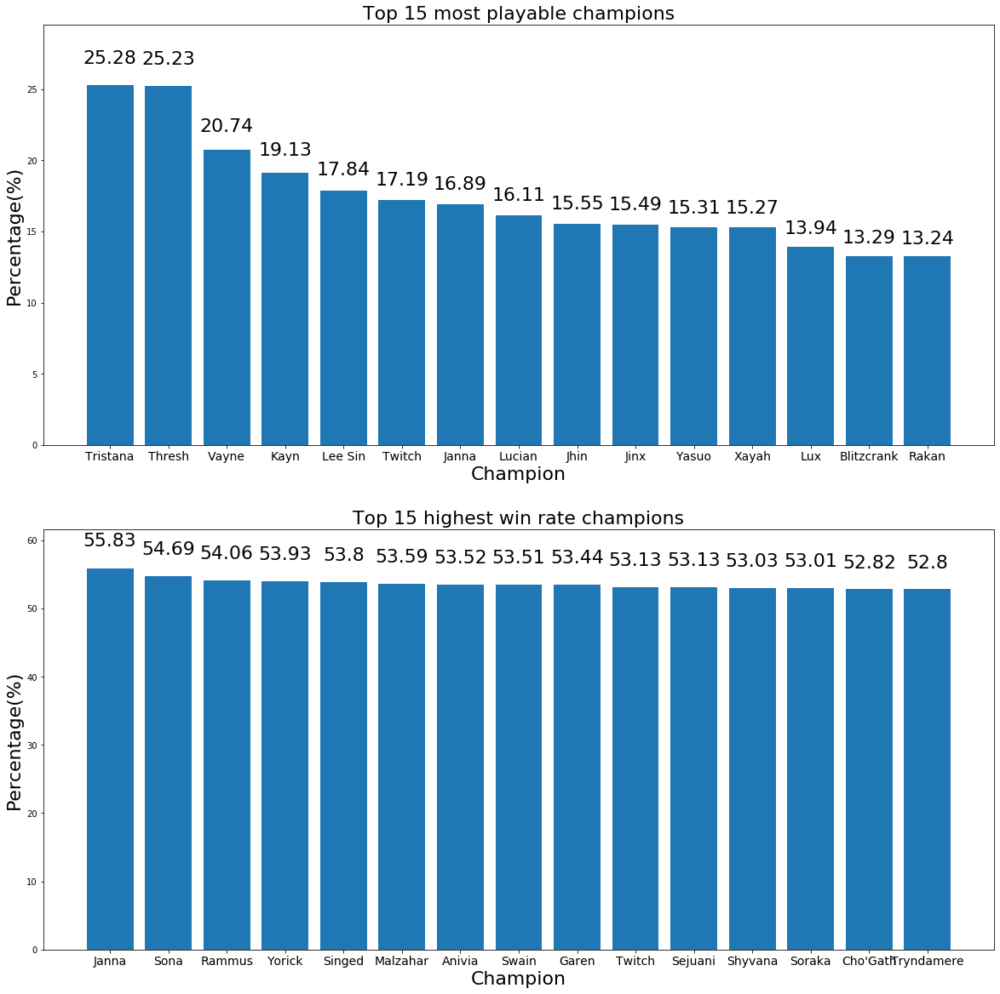

In [14]:
fig, ax = plt.subplots(2,1, figsize=(20,20))
champions = get_champions("Data/champion_info_2.json")

champion_play_rate = {}
champion_win_rate = {}
XY_peek = X4
XY_peek['winner'] = Y4
for ch in champions:
    p, w = get_play_and_win_rate(XY_peek, ch._champion_id)
    champion_play_rate[ch._name] = p
    champion_win_rate[ch._name] = w
    

# sort by acceding win and play rate
champion_play_rate_sorted = {k: v for k, v in sorted(champion_play_rate.items(), key=lambda item: item[1], reverse=True)}
champion_win_rate_sorted = {k: v for k, v in sorted(champion_win_rate.items(), key=lambda item: item[1], reverse=True)}

# Plot top 15 played
pr15 = list(itertools.islice(champion_play_rate_sorted.items(), 15))
bar_plot_of_champion_rate(ax[0], [v for k,v in pr15], [k for k,v in pr15], "Top 15 most playable champions", 22, 14) 

# PLot top 15 with highest win rate
wr15 = list(itertools.islice(champion_win_rate_sorted.items(), 15))
bar_plot_of_champion_rate(ax[1], [v for k,v in wr15], [k for k,v in wr15], "Top 15 highest win rate champions", 22, 14)

### Findings
From the graphs we can see that play rate has nothing much to do with win rate, and that no champions have a higher win rate than ~56%, which means the data is okay and not biased towards a single champion.

# 3. Classifiers

## 3.1 Classifier models

### 3.1.1 Decision trees

In [15]:
class DecisionTreeModel:
    def __init__(self, X_train, Y_train, X_test, Y_test):
        self._X_train = X_train
        self._Y_train = Y_train
        
        self._X_test = X_test
        self._Y_test = Y_test
        
        self._accuracy = None
        self._dtc = None
        self._dt = None
        self._criterion = None
        
        
    def create_decision_tree(self, crit='gini', max_depth=None, min_samples=100):
        self._dtc = tree.DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples, criterion=crit)
        self._criterion = crit
        

    def train_model(self):
        self._dt = self._dtc.fit(self._X_train, self._Y_train)
        Y_predicted = self._dt.predict(self._X_test)
        self._accuracy = metrics.accuracy_score(self._Y_test, Y_predicted)
        
        
    def get_depth(self):
        return self._dtc.get_depth()
        
        
    def visualise_tree(self, attributes, classes, file_name='File'):
        '''
        Very very slow compared to the rest of functionality, so use with caution
        '''
        # add graphviz
        tree_plot = tree.export_graphviz(self._dt, out_file=None, feature_names=attributes,
                                        class_names=classes, filled=True, rounded=True,
                                        special_characters=True)
        
        graph = graphviz.Source(tree_plot)
        graph.render(filename=file_name, format='png')
        
        
    def get_accuracy(self):
        return self._accuracy
    
    
    def get_classifier_parameters(self):
        return self._criterion, self._dtc.get_depth()
    
    
    def predict(self, Y):
        return self._dt.predict(Y)

### 3.1.2 Random forests

In [16]:
class RandomForestsModel:
    def __init__(self, X_train, Y_train, X_test, Y_test):
        self._X_train = X_train
        self._Y_train = Y_train
        
        self._X_test = X_test
        self._Y_test = Y_test
        
        self._accuracy = None
        self._rfc = None
        self._rf = None
        self._criterion = None
        self._trees_per_forest = None
        
    
    def create_random_forest(self, trees_per_forest=100, crit='gini', max_depth=None, min_samples=100):
        self._rfc = RandomForestClassifier(n_estimators=trees_per_forest, criterion=crit, max_depth=max_depth,
                                          min_samples_split=min_samples, n_jobs=-1)
        self._criterion = crit
        self._trees_per_forest = trees_per_forest
        

    def train_model(self):
        self._rf = self._rfc.fit(self._X_train, self._Y_train)
        Y_predicted = self._rf.predict(self._X_test)
        self._accuracy = metrics.accuracy_score(self._Y_test, Y_predicted)
        
        
    def get_accuracy(self):
        return self._accuracy
    
    
    def get_classifier_parameters(self):
        return self._criterion, self._trees_per_forest
    
    def predict(self, Y):
        return self._rf.predict(Y)

### 3.1.3 MLP's

In [17]:
class MultiLayerPerceptronModel:
    def __init__(self, X_train, Y_train, X_test, Y_test):
        self._X_train = X_train
        self._Y_train = Y_train
        
        self._X_test = X_test
        self._Y_test = Y_test
        
        self._mlpc = None
        self._mlp = None
        
        self._accuracy = None
        self._learning_rate = None
        self._alpha = None
        
    
    def create_neural_net(self, layers, solver, alpha, learning_rate, initial_learning_rate):
        self._mlpc = MLPClassifier(hidden_layer_sizes=layers, activation='relu', solver=solver, alpha=alpha,
                                 learning_rate=learning_rate, learning_rate_init=initial_learning_rate)
        
    
    def train_model(self):
        self._mlp = self._mlpc.fit(self._X_train, self._Y_train)
        self._accuracy = self._mlp.score(self._X_test, self._Y_test)
        
        
    def get_accuracy(self):
        return self._accuracy
    
    
    def get_classifier_parameters(self):
        return self._learning_rate, self._alpha
    
    
    def predict(self, Y):
        return self._mlp.predict(Y)

### 3.1.4 Classifier result

In [18]:
class ClassifierResult:
    def __init__(self, X, Y, decision_trees, random_forests, mlps):
        self._X = X
        self._Y = Y
        
        # Top classifiers with different hyper-parameters
        self._decision_trees = decision_trees
        self._random_forests = random_forests
        self._mlps = mlps
        
        
    def get_best_preforming_dt(self):
        ls = [i.get_accuracy() for i in self._decision_trees]
        return self._decision_trees[get_max_index(ls)]
    
    
    def get_best_preforming_rf(self):
        ls = [i.get_accuracy() for i in self._random_forests]
        return self._random_forests[get_max_index(ls)]
    
    
    def get_best_preforming_mlp(self):
        ls = [i.get_accuracy() for i in self._mlps]
        return self._mlps[get_max_index(ls)]
    
    
    def get_X(self):
        return self._X
    
    
    def get_Y(self):
        return self._Y

### 3.1.5 Classifier comparer

In [19]:
class ClassifierComparer:
    def __init__(self, classifierResult):
        self._classifierResult = classifierResult
        
        self._dt_auc = None
        self._rf_auc = None
        self._mlp_auc = None
        
    def plot_top_classifier_roc_curves(self, figsize, normalize=False):
        fig, ax = plt.subplots(1,1, figsize=figsize)
        
        X = self._classifierResult.get_X()
        Y = self._classifierResult.get_Y()
        
        dt_pred = self._classifierResult.get_best_preforming_dt().predict(X)
        rf_pred = self._classifierResult.get_best_preforming_rf().predict(X)
        mlp_pred = self._classifierResult.get_best_preforming_mlp().predict(X)
        
        # Transform so that team 1(blue team) would be 0 and team 2(red team) would be 1
        if normalize:
            Y = Y - 1
            dt_pred = dt_pred - 1
            rf_pred = rf_pred -1
            mlp_pred = mlp_pred - 1
        
        dt_fp, dt_tp, _ = metrics.roc_curve(Y, dt_pred)
        rf_fp, rf_tp, _ = metrics.roc_curve(Y, rf_pred)
        mlp_fp, mlp_tp, _ = metrics.roc_curve(Y, mlp_pred)
        
        self._dt_auc = metrics.auc(dt_fp, dt_tp)
        self._rf_auc = metrics.auc(rf_fp, rf_tp)
        self._mlp_auc = metrics.auc(mlp_fp, mlp_tp)
        
        ax.plot(dt_fp, dt_tp, color='red', marker='D')
        ax.plot(rf_fp, rf_tp, color='green', marker='o')
        ax.plot(mlp_fp, mlp_tp, color='blue', marker='x')
        ax.plot(ax.get_xlim(), ax.get_ylim(), color='black', linestyle='dashed')
        
        ax.set_title("classifier ROC curves", fontsize=24)
        ax.set_xlabel("False positives(FP)", fontsize=24)
        ax.set_ylabel("True positives(TP)", fontsize=24)
        
        
        ax.legend(['Decision tree('+str(self._dt_auc)+')', 'Random forest('+str(self._rf_auc)+')',
                   'Multi layer perceptron('+str(self._mlp_auc)+')'], prop={'size': 16})
        
        
    def get_aucs(self):
        return self._dt_auc, self._rf_auc, self._mlp_auc

### 3.1.6 Ensemble

In [20]:
class MyEnsemble:
    def __init__(self, dt, rf, mlp):
        self._dt = dt
        self._rf = rf
        self._mlp = mlp
        
    def predict_single(self, x, y):
        y_dt = dt.predict(x)
        y_rf = rf.predict(x)
        y_mlp = mlp.predict(x)
        
        return 1 if (y_dt + y_rf + y_mlp) >= 2 else 0
    
    def predict(self, X, normalize=False):
        Y_dt = self._dt.predict(X)
        Y_rf = self._rf.predict(X)
        Y_mlp = self._mlp.predict(X)
        
        # Transform so that team 1(blue team) would be 0 and team 2(red team) would be 1
        if normalize:
            Y_dt = Y_dt - 1
            Y_rf = Y_rf -1
            Y_mlp = Y_mlp - 1
        
        ensemble_arr = np.array([Y_dt, Y_rf, Y_mlp])
        ensemble_mean = np.mean(ensemble_arr, axis=0)
        predicted = np.array([1 if val >= 2/3 else 0 for val in ensemble_mean])
        
        if normalize:
            predicted = predicted + 1
        
        return predicted

## 3.2 Training models

In [21]:
def decision_tree_model(ax, X_train, Y_train, X_test, Y_test, dt_depth_range, dt_min_samples):
    '''
    Trains a decesion tree classifier based on given parameters and returns the highest accuracy gini and entropy tree
    ax - axis to plot on
    X_train - Classifier training data
    Y_train - Classifier training data labels
    X_test - Classifier test data
    Y_test - Classifier test data labels
    test_split - percentage of data to be left out for testing
    dt_depth_range - maximum tree depth
    dt_min_samples - the minimum amount of samples needed to keep making partitions
    '''
    dt_min_depth = 5
    parameter_range = [i for i in range(dt_min_depth, dt_depth_range)]
    legend = ["criterion=gini; min_samples="+str(dt_min_samples), "criterion=entropy; min_samples="+str(dt_min_samples)]
    
    
    decisionTrees = []
    accuracies_gini = []
    
    # (self, crit='gini', max_depth=None, min_samples=100):

    for i in range(dt_min_depth, dt_depth_range):
        decisionTree = DecisionTreeModel(X_train, Y_train, X_test, Y_test)
        decisionTree.create_decision_tree("gini", i, min_samples=dt_min_samples)
        decisionTree.train_model()
        accuracies_gini.append(decisionTree.get_accuracy())
        decisionTrees.append(decisionTree)

    best_gini_tree = decisionTrees[get_max_index(accuracies_gini)]
    

    decisionTrees = []
    accuracies_entropy = []


    for i in range(dt_min_depth, dt_depth_range):
        decisionTree = DecisionTreeModel(X_train, Y_train, X_test, Y_test)
        decisionTree.create_decision_tree("entropy", i, min_samples=dt_min_samples)
        decisionTree.train_model()
        accuracies_entropy.append(decisionTree.get_accuracy())
        decisionTrees.append(decisionTree)
        

    best_entropy_tree = decisionTrees[get_max_index(accuracies_entropy)]
    
    plot_classifier_accuracy(ax, parameter_range, [accuracies_gini, accuracies_entropy], legend,
                             "Tree depth", "Tree accuracy",
                             "Decision Tree classifier accuracy", 28)
    
    return best_gini_tree, best_entropy_tree


def train_dt(X_train, Y_train, X_test, Y_test, figsize, depth):
    '''
    X_train - Classifier training data
    Y_train - Classifier training data labels
    X_test - Classifier test data
    Y_test - Classifier test data labels
    figsize - Subplot figure size
    depth - Max depth of decision tree
    '''
    fig, ax = plt.subplots(2,2, figsize=figsize)
    decision_trees = []
    
    g, e = decision_tree_model(ax[0][0], X_train, Y_train, X_test, Y_test, depth, dt_min_samples=200)
    decision_trees.append(g)
    decision_trees.append(e)

    g, e = decision_tree_model(ax[0][1], X_train, Y_train, X_test, Y_test, depth, dt_min_samples=100)
    decision_trees.append(g)
    decision_trees.append(e)

    g, e = decision_tree_model(ax[1][0], X_train, Y_train, X_test, Y_test, depth, dt_min_samples=50)
    decision_trees.append(g)
    decision_trees.append(e)

    g, e = decision_tree_model(ax[1][1], X_train, Y_train, X_test, Y_test, depth, dt_min_samples=25)
    decision_trees.append(g)
    decision_trees.append(e)
    
    return decision_trees

In [22]:
def random_forest_model(ax, X_train, Y_train, X_test, Y_test, rf_trees_per_forest, rf_depth_range, rf_min_samples):
    '''
    Trains random forest classifier with different parameters and returns the top performing gini and entropy based forests
    ax - axis to plot on
    X_train - Classifier training data
    Y_train - Classifier training data labels
    X_test - Classifier test data
    Y_test - Classifier test data labels
    test_split - percentage of data to be left out for testing
    rf_trees_per_forest - The amount of trees to construct a forrest
    dt_depth_range - maximum tree depth
    dt_min_samples - the minimum amount of samples needed to keep making partitions
    '''
    rf_min_depth = 5
    parameter_range = [i for i in range(rf_min_depth, rf_depth_range)]
    legend = ["criterion=gini; min_samples="+str(rf_min_samples), "criterion=entropy; min_samples="+str(rf_min_samples)]
    
    
    randomForests = []
    accuracies_gini = []
    
    #(self, trees_per_forest=100, crit='gini', max_depth=None, min_samples=100):
    for i in range(rf_min_depth, rf_depth_range):
        randomForest = RandomForestsModel(X_train, Y_train, X_test, Y_test)
        randomForest.create_random_forest(rf_trees_per_forest, "gini", i, min_samples=rf_min_samples)
        randomForest.train_model()
        accuracies_gini.append(randomForest.get_accuracy())
        randomForests.append(randomForest)


    best_gini_forest = randomForests[get_max_index(accuracies_gini)]

    randomForests = []
    accuracies_entropy = []

    for i in range(rf_min_depth, rf_depth_range):
        randomForest = RandomForestsModel(X_train, Y_train, X_test, Y_test)
        randomForest.create_random_forest(rf_trees_per_forest, "entropy", i, min_samples=rf_min_samples)
        randomForest.train_model()
        accuracies_entropy.append(randomForest.get_accuracy())
        randomForests.append(randomForest)
        

    best_entropy_forest = randomForests[get_max_index(accuracies_entropy)]
    
    plot_classifier_accuracy(ax, parameter_range, [accuracies_gini, accuracies_entropy], legend,
                             "Forest tree depth", "Forest accuracy",
                             "Random forest classifier accuracy based on trees per forest= " + str(rf_trees_per_forest),
                             28)
    
    return best_gini_forest, best_entropy_forest


def train_rf(X_train, Y_train, X_test, Y_test, figsize, depth):
    '''
    X_train - Classifier training data
    Y_train - Classifier training data labels
    X_test - Classifier test data
    Y_test - Classifier test data labels
    figsize - Subplot figure size
    depth - Max depth of decision tree
    '''
    fig, ax = plt.subplots(2,2, figsize=figsize)
    random_forrests = []
    
    g, e = random_forest_model(ax[0][0], X_train, Y_train, X_test, Y_test,
                           rf_trees_per_forest=100, rf_depth_range=depth, rf_min_samples=100)
    random_forrests.append(g)
    random_forrests.append(e)

    g, e = random_forest_model(ax[0][1], X_train, Y_train, X_test, Y_test,
                               rf_trees_per_forest=200, rf_depth_range=depth, rf_min_samples=100)
    random_forrests.append(g)
    random_forrests.append(e)

    g, e = random_forest_model(ax[1][0], X_train, Y_train, X_test, Y_test,
                               rf_trees_per_forest=300, rf_depth_range=depth, rf_min_samples=100)
    random_forrests.append(g)
    random_forrests.append(e)

    g, e = random_forest_model(ax[1][1], X_train, Y_train, X_test, Y_test, 
                               rf_trees_per_forest=400, rf_depth_range=depth, rf_min_samples=100)
    random_forrests.append(g)
    random_forrests.append(e)

    return random_forrests

In [23]:
def multi_layer_perceptron_model(ax, X_train, Y_train, X_test, Y_test, alpha, hls, hlc):
    '''
    Train a multi-layer perceptron with given hyperparameters and returns the best one.
    ax - axis to plot on
    X_train - Classifier training data
    Y_train - Classifier training data labels
    X_test - Classifier test data
    Y_test - Classifier test data labels
    alpha - Reguliarization parameter, which gives penalises the mlp
    hls - Hidden layer starting size, will increase to up to +3
    hlc - Hidden layer starting count, will increase up to +20
    '''
    legend = ["adam with " + str(hls + i + 1) + " hidden layer size" for i in range(3)]
    parameter_range = [hlc + i for i in range(1,21)]
    
    best_adams = [] # best MLPS with adam solver
    accuracies = [] # list of lists that consists accuracies
    
    for k in range(3):
        
        mlps = []
        mlp_accuracies = []
        
        # adam solver with hidden layer count from 1 to 20
        # Learning rate is constant because it's used only in sgd sovler
        # Learning rate is a bit higher since adam tweaks it value while training the model
        for i in range(0, 20):
            mlp = MultiLayerPerceptronModel(X_train, Y_train, X_test, Y_test)
            mlp.create_neural_net((hlc+i,hls+k), 'adam', alpha, 'constant', .004)
            mlp.train_model()
            mlps.append(mlp)
            mlp_accuracies.append(mlp.get_accuracy())

        best_adams.append(mlps[get_max_index(mlp_accuracies)])
        accuracies.append(mlp_accuracies)
        
        
    plot_classifier_accuracy(ax, parameter_range, accuracies, legend, "Hidden layer count", "Accuracy",
                                ( "MLP accuracy, with alpha="+ str(alpha) + " "
                                 "hidden layer size: (["+str(hlc)+"-"+str(hlc+20) + "] : "+str(hls)+")"), 28)
    
    return best_adams
    
    
def train_mlp(X_train, Y_train, X_test, Y_test, figsize, alpha, hlsizes, hlcounts):
    '''
    X_train - Classifier training data
    Y_train - Classifier training data labels
    X_test - Classifier test data
    Y_test - Classifier test data labels
    figsize - Subplot figure size
    '''
    fig, ax = plt.subplots(5,1, figsize=figsize)
    
    mlps = []
    
    for i in range(5):
        m = multi_layer_perceptron_model(ax[i], X_train, Y_train, X_test, Y_test, alpha, hlsizes[i], hlcounts[i])
        mlps.extend(m)
    
    return mlps

# 4. Training classifiers

## 4.1 First subset of attributes

In [24]:
test_split = 0.25
depth = 30
figure_size = (40,45)
alpha = 1e-5
hlsizes = [6,9,12,12,9]
hlcounts = [1, 20, 1, 20, 40] # this is the lower bound it'll be iterated from index to index + 20

# attributes for visualising tree
attributes = ['Game duration', 'First blood', 'First tower destroyed', 'First inhibitor destroyed', 'First dragon taken',
             'First rift herald taken', 'First baron taken', 'Towers destroyed', 'Inhibitors destroyed', 'Barons taken',
             'Dragons taken']

classes = ['Lost', 'Won']

X_train, X_test, Y_train, Y_test = train_test_split(X1, Y1, test_size=test_split)

X_train.head()

,gameDuration,firstBlood,firstTower,firstInhibitor,firstDragon,firstRiftHerald,firstBaron,t1_towerKills,t1_inhibitorKills,t1_baronKills,t1_dragonKills
46050,1976,1,1,1,1,0,1,10,2,1,2
3358,2478,1,1,0,0,0,0,4,0,0,1
29565,1887,0,1,1,1,0,1,10,2,1,2
31784,2366,0,1,1,1,0,1,9,1,2,3
28352,3065,0,1,1,1,0,1,7,2,1,2


### 4.1.1 Decession Trees

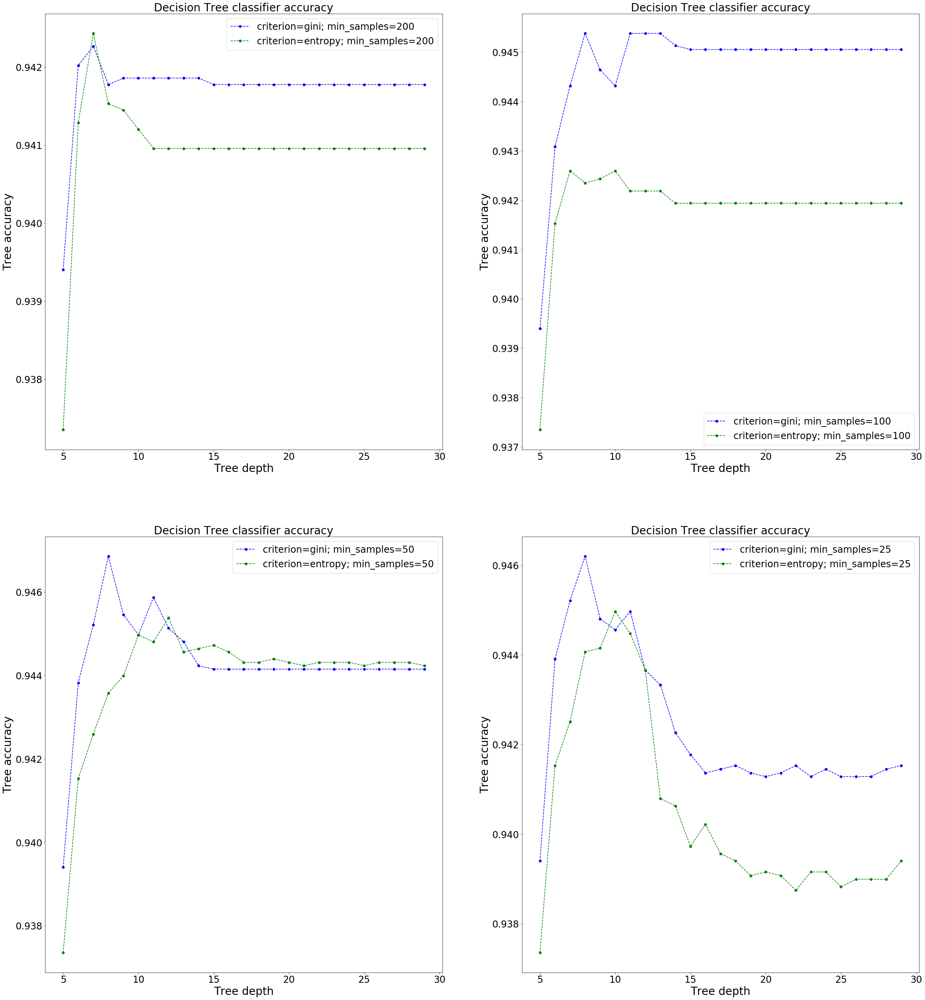

In [25]:
decision_trees = train_dt(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings

It looks like the gini and entropy splitting criterion give usually pretty much the same performance, that differ around ~2% on average. Overall we have around 95% accuracy on the test set which is quite decent. Also minimum sample amount needed for splitting doesn't have a huge impact, possibly indicating that the splits tend to be high in purity. It also looks like having a Tree depth from 5 to 15 provides sufficiently accurate results

### 4.1.2 Random forrests

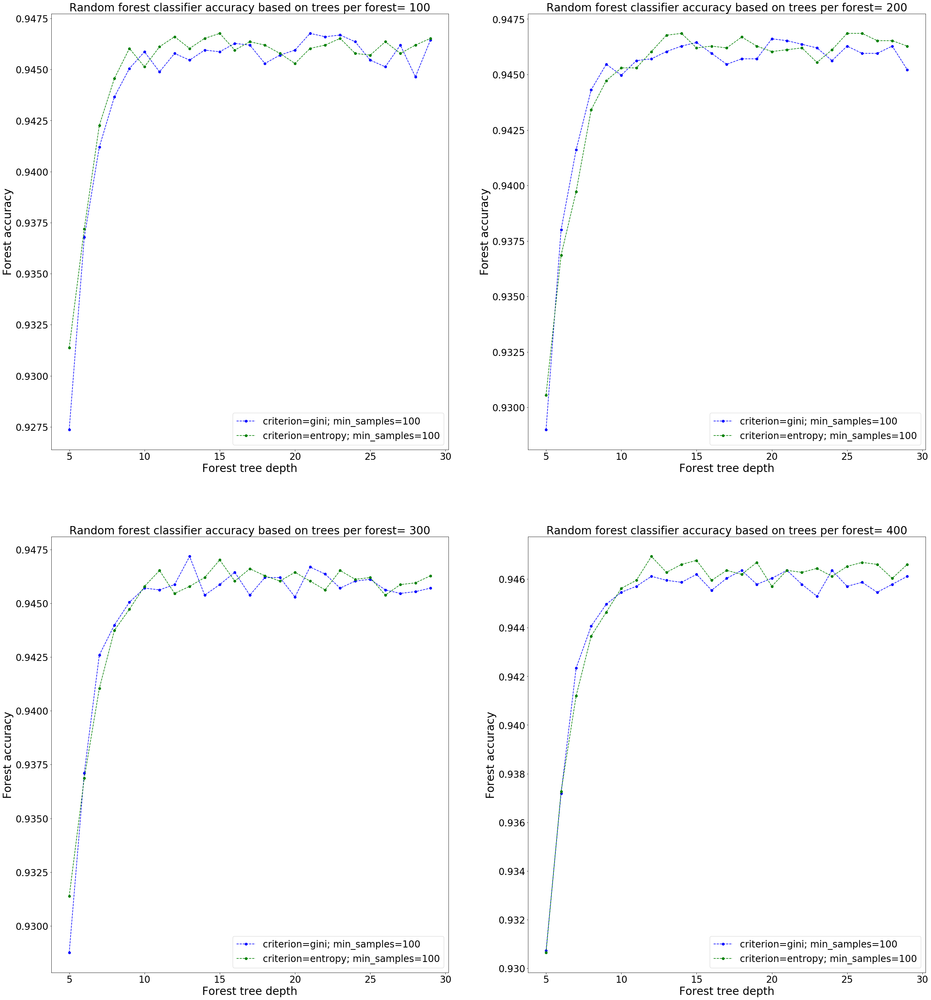

In [26]:
random_forrests = train_rf(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings
For random forests the criterion has even less of an impact on the classification accuracy. We can also see that it is only slightly worse than Decision trees, the accuracy is pretty much the same, it differs by ~0.1%. The accuracy also peeks at quite similar tree depths as well, though the more trees per forest, the quicker it peaks.

### 4.1.3 Multi layer perceptron

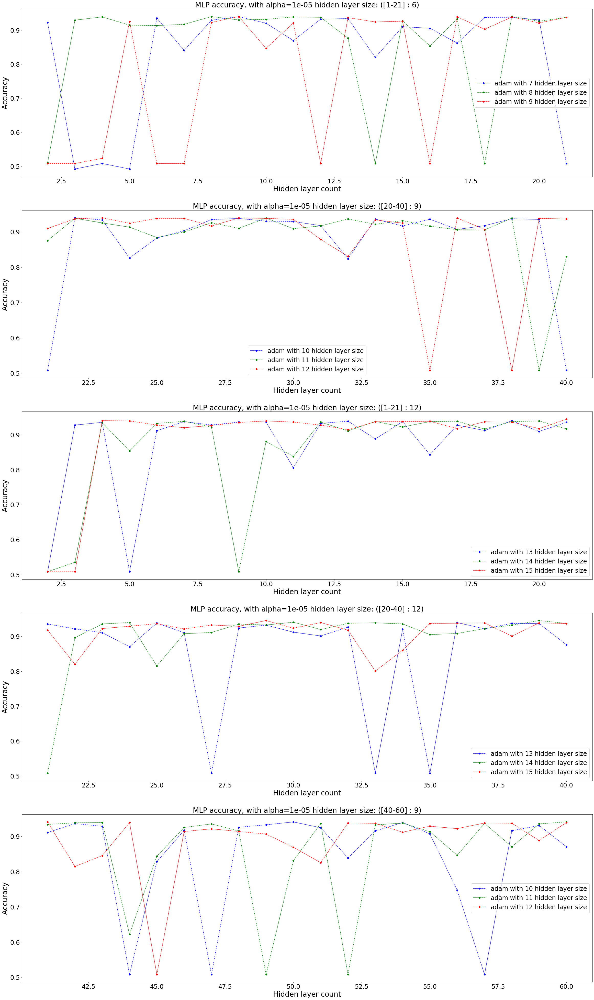

In [27]:
# Commented out by default, because the training takes a while
mlps = train_mlp(X_train, Y_train, X_test, Y_test, (40,70), alpha, hlsizes, hlcounts)

#### Findings

Of all the different solvers, Adam worked the best by quite a lot so we decided to only to use it for further training. The results are quite interesting, because for some sets of hidden layer sizes, the NN doesn't learn anything and remains at ~50% accuracy. The smaller the hidden layer size is the more common are the dips in accuracy. But overall it looks like it has ~93-95% accuracy which is also quite good. 

## Analysis of all classifier findings

We can see that the classifiers perform quite similarly, decision tree and random forests don't have huge dips in accuracy with any parameters. Though the classifier training process time varies greatly. decision trees take a couple of minutes, random forests around 5-7 minutes and MLP's can take up to 10 minutes. We have check which classifier has the best accuracy, we'll do that by plotting their ROC curves and calculating AUC.

### 4.1.4 Comparing classifiers

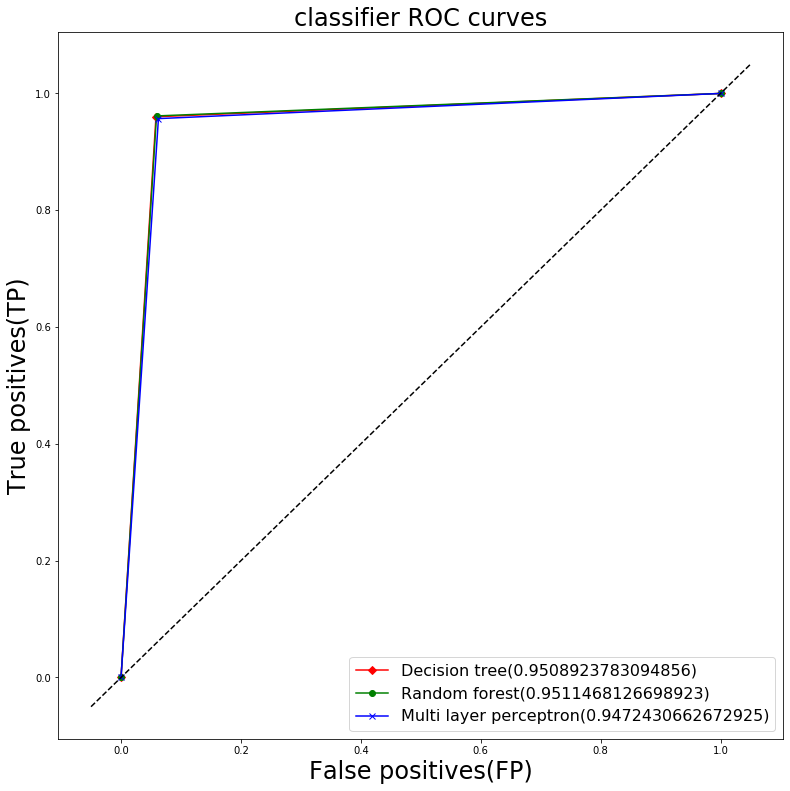

In [28]:
result = ClassifierResult(X1, Y1, decision_trees, random_forrests, mlps)
comparer = ClassifierComparer(result)

comparer.plot_top_classifier_roc_curves((13,13))      

### 4.1.5 Ensemble classifier

Since the classifiers are performing around 95% maybe it would be a good idea to make an ensemble model, and take the majority decision, maybe that would increase the accuracy a bit.

In [29]:
# Saving decision tree as an png to look at.
result.get_best_preforming_dt().visualise_tree(attributes, classes, 'Tree1')

ensemble = MyEnsemble(result.get_best_preforming_dt(), result.get_best_preforming_rf(), result.get_best_preforming_mlp())
predictions = ensemble.predict(X1)

accuracy = metrics.accuracy_score(Y1, predictions)

print(accuracy)

0.9521723107161869


### 4.1.6 Testing real games

Checking out how this tool works when we take a new random game sample

In [30]:
# reminder of the data columns:
#X1 = copy1_df[['gameDuration', 'firstBlood', 'firstTower', 'firstInhibitor', 'firstDragon', 'firstRiftHerald', 'firstBaron',
#              't1_towerKills', 't1_inhibitorKills', 't1_baronKills', 't1_dragonKills']]

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343487193/24727655?tab=overview
# from team-blue perspective, 
t1_x = [1541, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
t1_y = 0

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343503834/24727655?tab=overview
# from team-red perspective, y=won
t2_x = [2251, 1, 0, 0, 1, 0, 1, 7, 1, 1, 4]
t2_y = 1

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4333810100/24727655?tab=overview
# from team-red perspective, 
t3_x = [2127, 1, 0, 1, 1, 1, 0, 7, 2, 0, 3]
t3_y = 1

test_x = np.array([t1_x, t2_x, t3_x])
test_y = np.array([t1_y, t2_y, t3_y])

predictions = ensemble.predict(test_x)

for i in range(3):
    print("Test " + str(i+1) +". predicted is " + str(predictions[i]) + " and actual value is " + str(test_y[i]))

Test 1. predicted is 0 and actual value is 0
Test 2. predicted is 1 and actual value is 1
Test 3. predicted is 1 and actual value is 1


## Findings from the first subset

The accuracy from the ensemble method increased the accuracy by 0.2% which is kind of insignificant. We can see that all the classifiers hit an accuracy peakin around the 94-95% mark and can't get better, even if we ensemble them together, it looks like they tend to classify quite similarly. By testing it with the new random data from a website, the predictions look well. We only tested 3 cases but all of them were correct, digging more of them up is quite a cumbersome process.

## 4.2 Second subset of attributes

In [30]:
test_split = 0.25
depth = 45
figure_size = (40,45)
alpha = 1e-5
hlsizes = [9,12,15,15,12]
hlcounts = [1, 40, 20, 1, 100] # this is the lower bound it'll be iterated from index to index + 20

# attributes for visualising tree
attributes = ['Game duration', 'First blood', 'First tower destroyed', 'First inhibitor destroyed', 'First dragon taken',
             'First rift herald taken', 'First baron taken', 
             'Towers destroyed by Blue', 'Inhibitors destroyed by Blue', 'Barons taken by Blue', 'Dragons taken by Blue',
             'Towers destroyed by Red', 'Inhibitors destroyed by Red', 'Barons taken by Red', 'Dragons taken by Red']

classes = ['Blue won', 'Red won']

X_train, X_test, Y_train, Y_test = train_test_split(X2, Y2, test_size=test_split)

X_train.head()

,gameDuration,firstBlood,firstTower,firstInhibitor,firstDragon,firstRiftHerald,firstBaron,t1_towerKills,t1_inhibitorKills,t1_baronKills,t1_dragonKills,t2_towerKills,t2_inhibitorKills,t2_baronKills,t2_dragonKills
14207,1803,1,1,2,2,0,0,4,0,0,2,6,1,0,1
35730,1749,2,1,1,1,0,1,10,2,1,2,0,0,0,0
27733,1540,1,1,1,1,1,1,11,3,1,2,0,0,0,0
7130,1736,2,2,2,2,0,0,2,0,0,0,10,2,0,3
19066,1973,1,1,1,1,1,1,11,2,1,3,2,0,0,1


### 4.2.1 Decession Trees

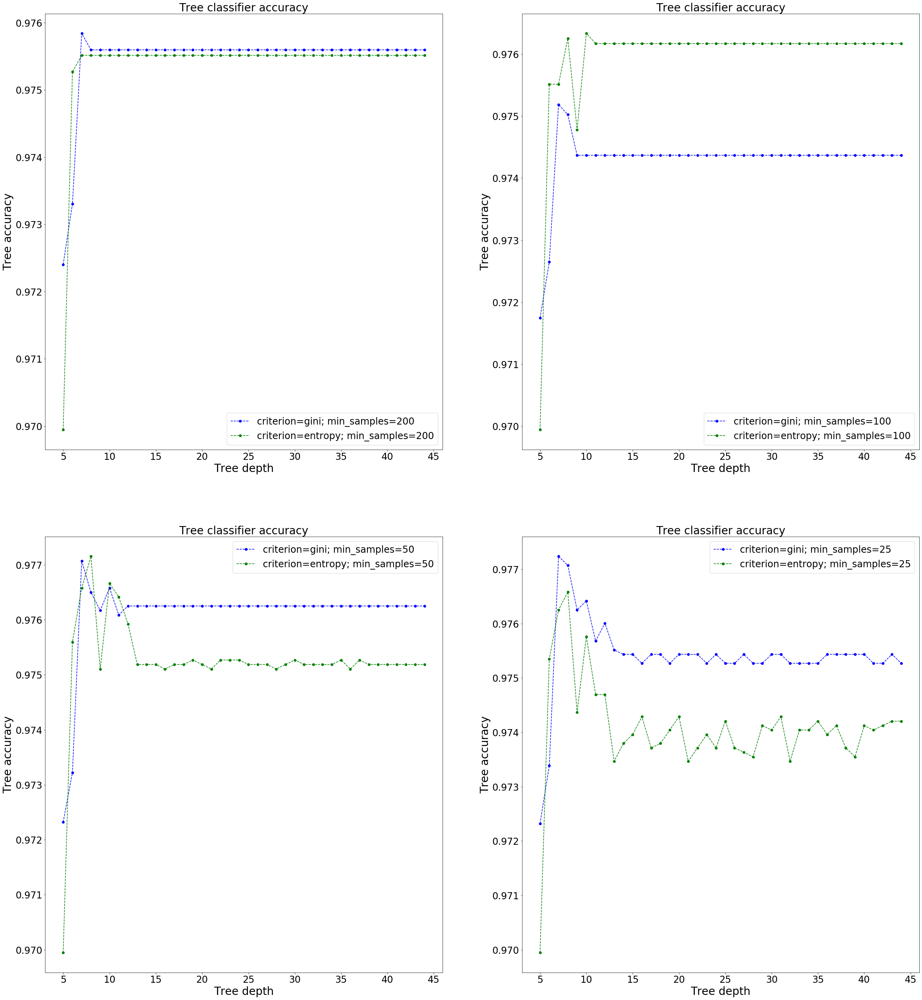

In [31]:
decision_trees = train_dt(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings

We can see the same tendencies as with the first data set, but a decent increase in accuracy, it's almost 98% which is very very high. The optimal tree depth remains pretty much the same staying in range of 5 to 15.

### 4.2.2 Random forrests

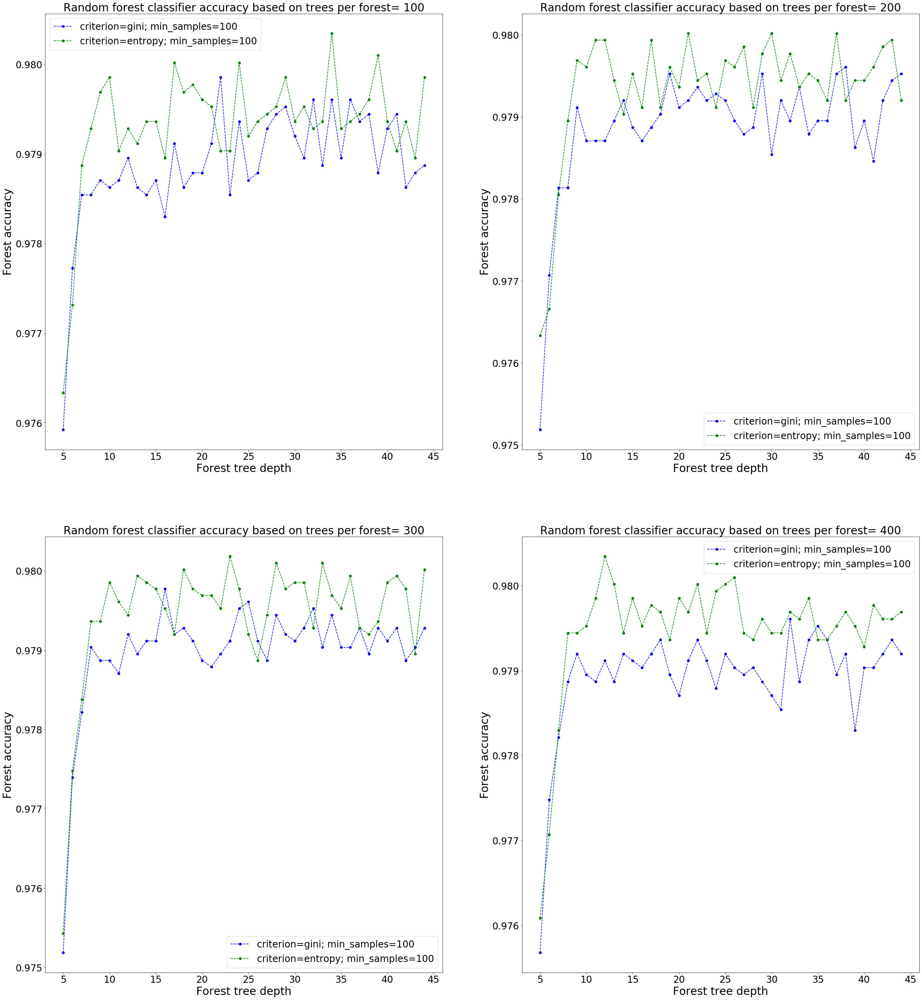

In [32]:
random_forrests = train_rf(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings

Same goes for random forests, they are about ~1% better and the splitting criterion has less of an impact.

### 4.2.3 Multi layer perceptron

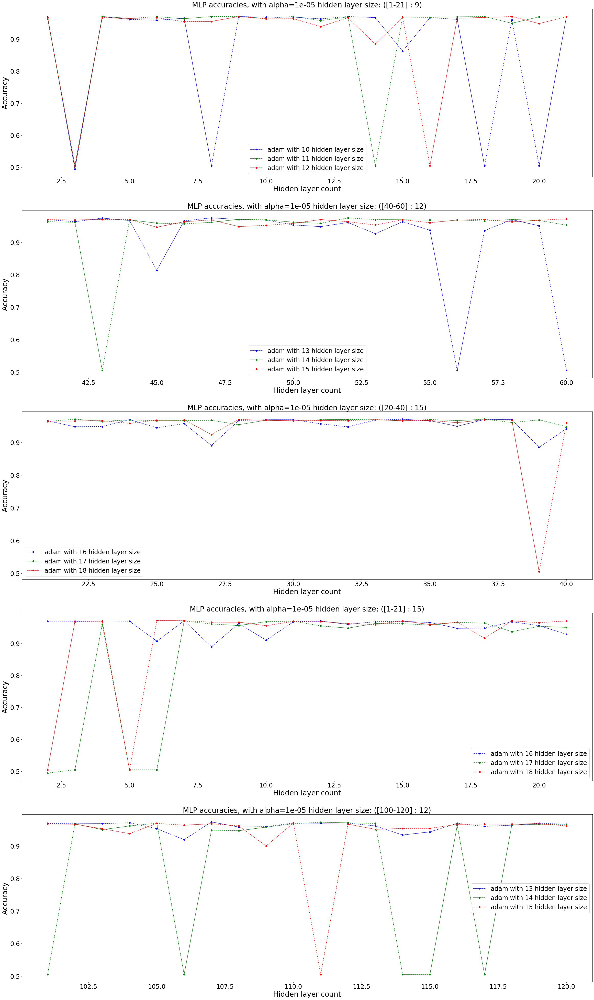

In [33]:
# Commented out by default, because the training takes a while
mlps = train_mlp(X_train, Y_train, X_test, Y_test, (40,70), alpha, hlsizes, hlcounts)

#### Findings

Yet again Adam worked better than other solvers, so we stuck with it, though the hyper-parameters were different. Since we had more features the hidden layer size was also increase, we also tried a deeper network with 100 hidden layers, but the results remain the same. Decision trees and Random forests still outperform the MLP, by a small amount.

## Analysis of all classifier findings

Classifiers perform similarly as well, like the first part, decision trees and random forests don't have huge dips in accuracy. The main difference here is training time. Random forests stay usually under 10 minutes while MLPS can take around 20 minutes to train, which is getting tedious for finding the correct hyper-parameters. I'll do the sane classifier check as I did with the first data subset.

### 4.2.4 Comparing classifiers

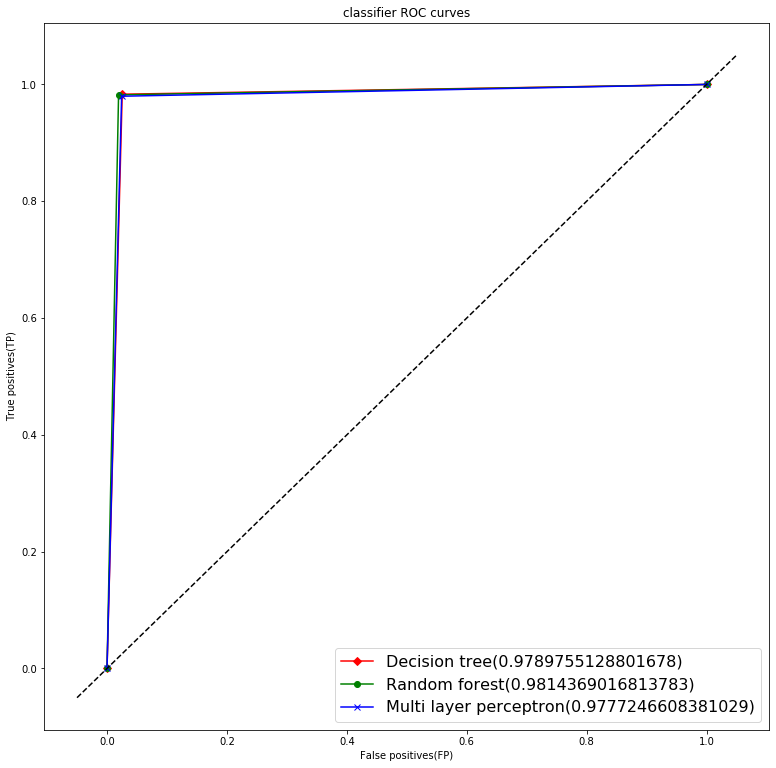

In [34]:
result = ClassifierResult(X2, Y2, decision_trees, random_forrests, mlps)
comparer = ClassifierComparer(result)

comparer.plot_top_classifier_roc_curves((13,13), True)

### 4.2.5 Ensemble classifier

In [35]:
# Saving decision tree as an png to look at.
result.get_best_preforming_dt().visualise_tree(attributes, classes, 'Tree2')

ensemble = MyEnsemble(result.get_best_preforming_dt(), result.get_best_preforming_rf(), result.get_best_preforming_mlp())
predictions = ensemble.predict(X2, normalize=True)

accuracy = metrics.accuracy_score(Y2, predictions)

print(accuracy)

0.9807542688669587


### 4.2.6 Testing real games

In [36]:
# reminder of the data columns:
#X2 = copy2_df[['gameDuration', 'firstBlood', 'firstTower', 'firstInhibitor', 'firstDragon', 'firstRiftHerald', 'firstBaron', 
#                                 't1_towerKills', 't1_inhibitorKills', 't1_baronKills', 't1_dragonKills',
#                                 't2_towerKills', 't2_inhibitorKills', 't2_baronKills', 't2_dragonKills']]

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343487193/24727655?tab=overview
t1_x = [1541, 2, 2, 2, 2, 2, 2, 
        0, 0, 0, 1,
       8, 1, 1, 3]
t1_y = 2

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343503834/24727655?tab=overview
t2_x = [2251, 2, 1, 2, 2, 0, 2,
        4, 0, 0, 2,
       11, 6, 3, 4]
t2_y = 2

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4333810100/24727655?tab=overview
t3_x = [2127, 2, 2, 2, 2, 2, 2,
        3, 0, 0, 2,
        7, 2, 0, 3]
t3_y = 2

#https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4333813733/229940470?tab=overview
t4_x = [2623, 1, 1, 1, 2, 1, 1,
        10, 3, 1, 5,
        4, 0, 0, 2]
t4_y = 1

test_x = np.array([t1_x, t2_x, t3_x, t4_x])
test_y = np.array([t1_y, t2_y, t3_y, t4_y])

predictions = ensemble.predict(test_x, normalize=True)

for i in range(4):
    print("Test " + str(i+1) +". predicted is " + str(predictions[i]) + " and actual value is " + str(test_y[i]))

Test 1. predicted is 2 and actual value is 2
Test 2. predicted is 2 and actual value is 2
Test 3. predicted is 2 and actual value is 2
Test 4. predicted is 1 and actual value is 1


## Findings from the second subset

The accuracy increase from the ensemble methods barely made a difference. Maybe because there are not enough classifiers to make a difference, or maybe we are approaching the accuracy cap for having a generalized solution that does not overfit the data. The tests with random data from the game website are promising, since all of them are correctly classified.

## 4.3 Third subset of attributes

In [74]:
test_split = 0.2
depth = 40
figure_size = (40,45)
alpha = 1e-5
hlsizes = [8,10,8,10,13]
hlcounts = [40, 20, 60, 80, 100] # this is the lower bound it'll be iterated from index to index + 20

# attributes for visualising tree
attributes = ['Blue champion 1', 'Blue champion 2', 'Blue champion 3', 'Blue champion 4', 'Blue champion 5',
              'Red champion 1', 'Red champion 2', 'Red champion 3', 'Red champion 4', 'Red champion 5']

classes = ['Blue won', 'Red won']

X_train, X_test, Y_train, Y_test = train_test_split(X3, Y3, test_size=test_split)

X_train.head()

,t1_champ1id,t1_champ2id,t1_champ3id,t1_champ4id,t1_champ5id,t2_champ1id,t2_champ2id,t2_champ3id,t2_champ4id,t2_champ5id
40598,69,45,92,236,56,120,412,268,51,24
21816,79,236,267,114,18,29,32,41,61,98
13289,25,202,236,3,164,41,60,40,21,150
51216,105,11,10,412,22,497,7,19,498,14
13445,161,92,11,84,119,516,222,35,72,115


### 4.3.1 Decession Trees

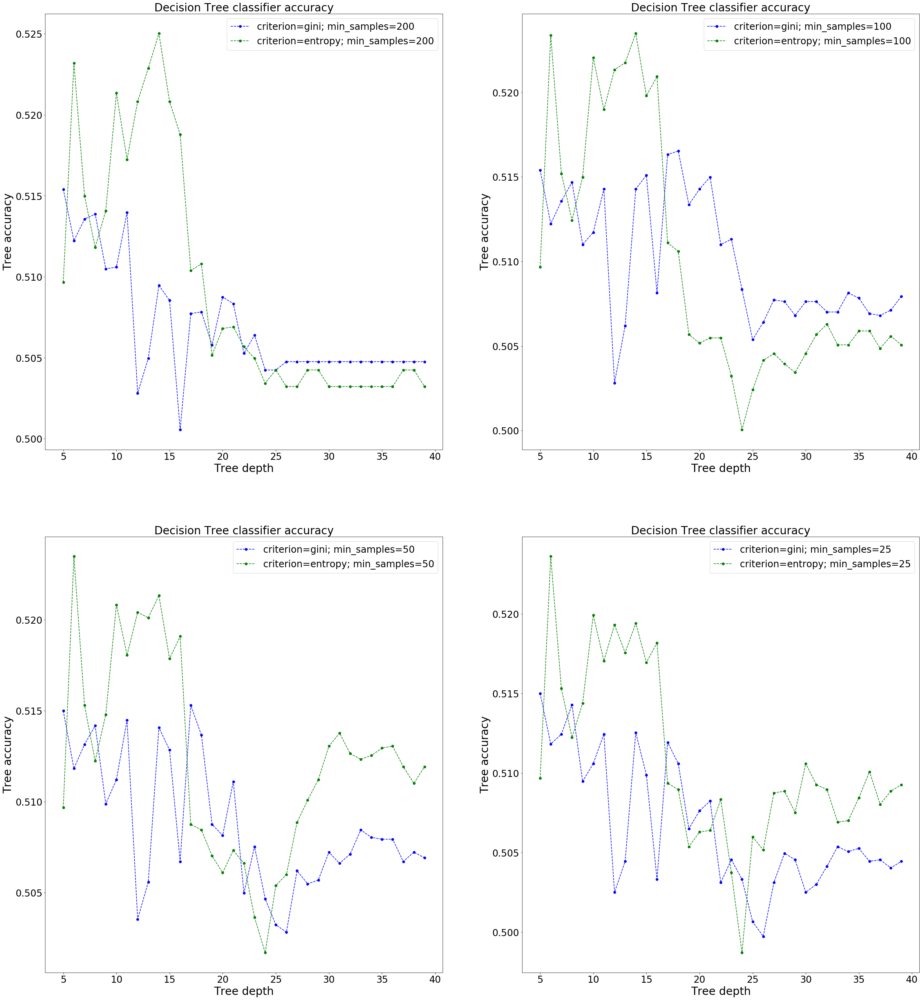

In [75]:
decision_trees = train_dt(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings

It appears that decision trees are unable to learn anything from data, because the accuracy oscillate around 50%

### 4.3.2 Random forrests

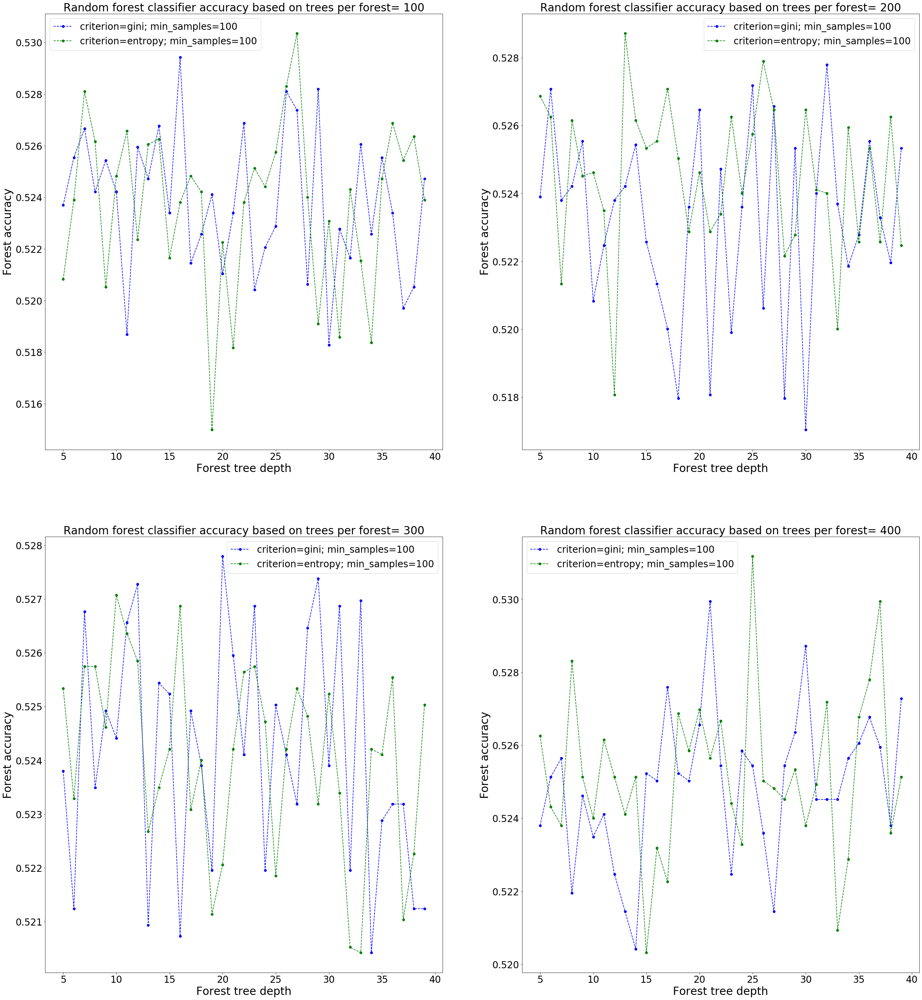

In [76]:
random_forrests = train_rf(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings

The same problem remains for random forests as well.

### 4.3.3 Multi layer perceptron

C:\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


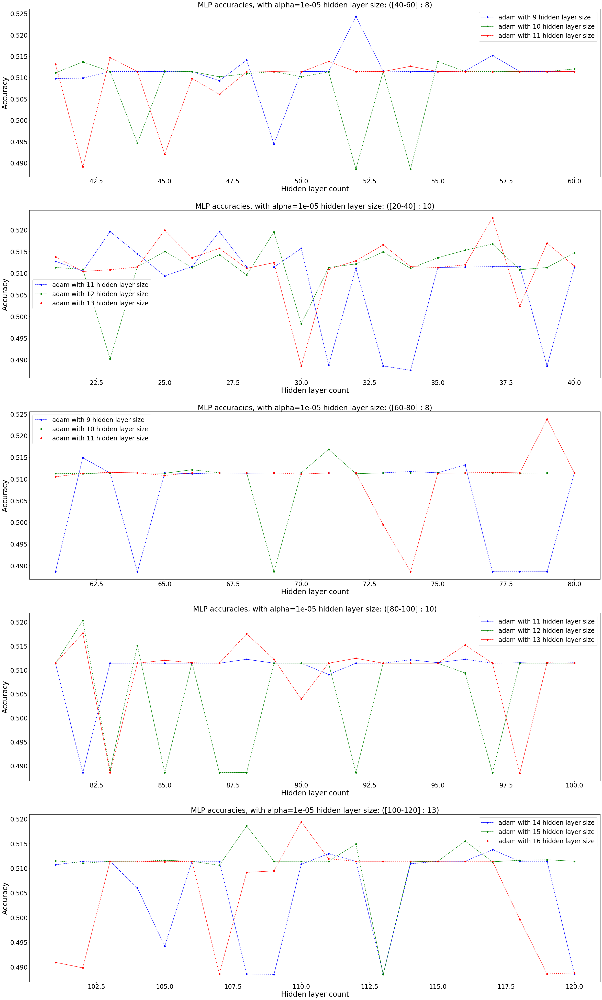

In [77]:
mlps = train_mlp(X_train, Y_train, X_test, Y_test, (40,70), alpha, hlsizes, hlcounts)

#### Findings

The same problem remains for multi-layer perceptrons as well.

### 4.3.4 Comparing classifiers

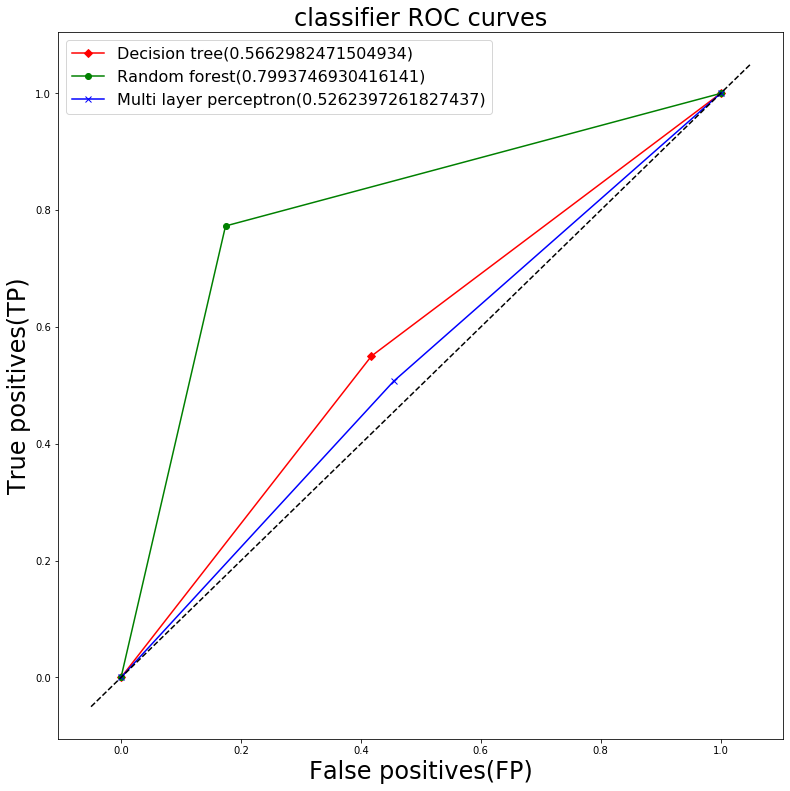

In [78]:
result = ClassifierResult(X3, Y3, decision_trees, random_forrests, mlps)
comparer = ClassifierComparer(result)

comparer.plot_top_classifier_roc_curves((13,13), True)

### 4.3.5 Ensemble classifier

In [79]:
# Saving decision tree as an png to look at.
result.get_best_preforming_dt().visualise_tree(attributes, classes, 'Tree3')

ensemble = MyEnsemble(result.get_best_preforming_dt(), result.get_best_preforming_rf(), result.get_best_preforming_mlp())
predictions = ensemble.predict(X3, normalize=True)

accuracy = metrics.accuracy_score(Y3, predictions)

print(accuracy)

0.6732934769255968


### 4.3.6 Testing real games

In [80]:
# attributes for visualising tree
attributes = ['Blue champion 1', 'Blue champion 2', 'Blue champion 3', 'Blue champion 4', 'Blue champion 5',
              'Red champion 1', 'Red champion 2', 'Red champion 3', 'Red champion 4', 'Red champion 5']

# parse champion to champ_id
cs = get_champions("Data/champion_info_2.json")

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343487193/24727655?tab=overview
t1_x = [get_champion_id(cs, 'Darius'),get_champion_id(cs, 'Xerath'),get_champion_id(cs, 'Gragas'),
        get_champion_id(cs, 'Ashe'),get_champion_id(cs, 'Thresh'),
        get_champion_id(cs, 'Blitzcrank'),get_champion_id(cs, 'Mordekaiser'),get_champion_id(cs, 'Malzahar'),
        get_champion_id(cs, 'Vayne'),get_champion_id(cs, 'Vi')]
t1_y = 2

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343503834/24727655?tab=overview
t2_x = [get_champion_id(cs, 'Twitch'),get_champion_id(cs, 'Rengar'),get_champion_id(cs, 'Yasuo'),
        get_champion_id(cs, 'Graves'),get_champion_id(cs, 'Varus'),
        get_champion_id(cs, 'Zed'),get_champion_id(cs, 'Kayn'),get_champion_id(cs, 'Xayah'),
        get_champion_id(cs, 'Ryze'),get_champion_id(cs, 'Nautilus')]
t2_y = 2

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4340612643/2098439705481600?tab=overview
t3_x = [get_champion_id(cs, 'Tristana'),get_champion_id(cs, 'Ashe'),get_champion_id(cs, 'Zed'),
        get_champion_id(cs, "Illaoi"),get_champion_id(cs, 'Kayn'),
        get_champion_id(cs, 'Tryndamere'),get_champion_id(cs, 'Viktor'),get_champion_id(cs, 'Shaco'),
        get_champion_id(cs, 'Caitlyn'),get_champion_id(cs, 'Nautilus')]
t3_y = 2

#https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4333813733/229940470?tab=overview
t4_x = [get_champion_id(cs, 'Ryze'),get_champion_id(cs, 'Morgana'),get_champion_id(cs, 'Tristana'),
        get_champion_id(cs, "Kha'Zix"),get_champion_id(cs, 'Renekton'),
        get_champion_id(cs, 'Karthus'),get_champion_id(cs, 'Yasuo'),get_champion_id(cs, 'Miss Fortune'),
        get_champion_id(cs, 'Nautilus'),get_champion_id(cs, 'Volibear')]
t4_y = 1

test_x = np.array([t1_x, t2_x, t3_x, t4_x])
test_y = np.array([t1_y, t2_y, t3_y, t4_y])

predictions = ensemble.predict(test_x, normalize=True)

for i in range(4):
    print("Test " + str(i+1) +". predicted is " + str(predictions[i]) + " and actual value is " + str(test_y[i]))

Test 1. predicted is 2 and actual value is 2
Test 2. predicted is 1 and actual value is 2
Test 3. predicted is 2 and actual value is 2
Test 4. predicted is 1 and actual value is 1


## Findings from the third subset

The classifiers could not predict the game outcome based on the the champions selected, though when ROC curve was plotted, based on the whole data, random forests had quite a decent AUC value and TP rate, also when all 3 classifiers were combine the accuracy reached 67% which is decent improvement, because alone none of them could correctly classify the data. Testing on real data also shows similar accuracy 75%, that is mainly because our real test sample is very small.

## 4.4 Fourth subset of attributes

In [63]:
test_split = 0.2
depth = 60
figure_size = (40,45)
alpha = 1e-5
hlsizes = [22,25,29,27,25]
hlcounts = [20, 60, 40, 1, 120] # this is the lower bound it'll be iterated from index to index + 20

# attributes for visualising tree
attributes = ['Game duration', 'First blood', 'First tower destroyed', 'First inhibitor destroyed', 'First dragon taken',
              'First rift herald taken', 'First baron taken', 
              'Towers destroyed by Blue', 'Inhibitors destroyed by Blue', 'Barons taken by Blue', 'Dragons taken by Blue',
              'Towers destroyed by Red', 'Inhibitors destroyed by Red', 'Barons taken by Red', 'Dragons taken by Red'
              'Blue champion 1', 'Blue champion 2', 'Blue champion 3', 'Blue champion 4', 'Blue champion 5',
              'Red champion 1', 'Red champion 2', 'Red champion 3', 'Red champion 4', 'Red champion 5']

classes = ['Blue won', 'Red won']


X_train, X_test, Y_train, Y_test = train_test_split(X4, Y4, test_size=test_split)

X_train.head()

,gameDuration,firstBlood,firstTower,firstInhibitor,firstDragon,firstRiftHerald,firstBaron,t1_towerKills,t1_inhibitorKills,t1_baronKills,...,t1_champ1id,t1_champ2id,t1_champ3id,t1_champ4id,t1_champ5id,t2_champ1id,t2_champ2id,t2_champ3id,t2_champ4id,t2_champ5id
39974,2243,2,2,2,2,2,2,6,0,0,...,42,53,236,59,19,98,516,40,222,25
48684,2375,1,1,2,1,0,1,7,1,1,...,117,121,122,51,42,36,64,103,412,15
51391,1807,2,2,2,2,0,0,2,0,0,...,81,85,105,141,157,240,99,79,45,202
6371,1575,2,2,2,1,1,0,3,0,0,...,18,161,75,21,64,44,67,5,86,4
10679,1943,1,1,2,1,0,1,3,0,1,...,412,68,51,8,28,63,11,23,37,110


### 4.4.1 Decession Trees

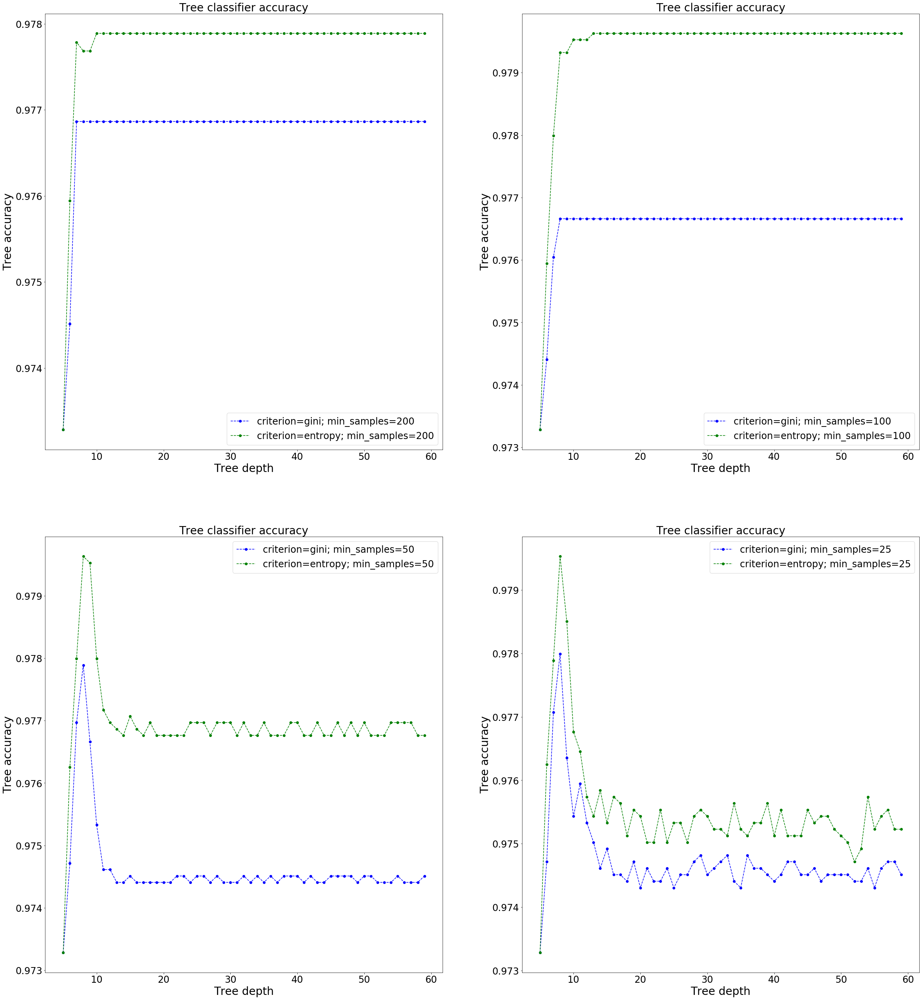

In [64]:
decision_trees = train_dt(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings

The decision trees have almost the same accuracy as the second data subset, on average it's better by 0.1%

### 4.4.2 Random forrests

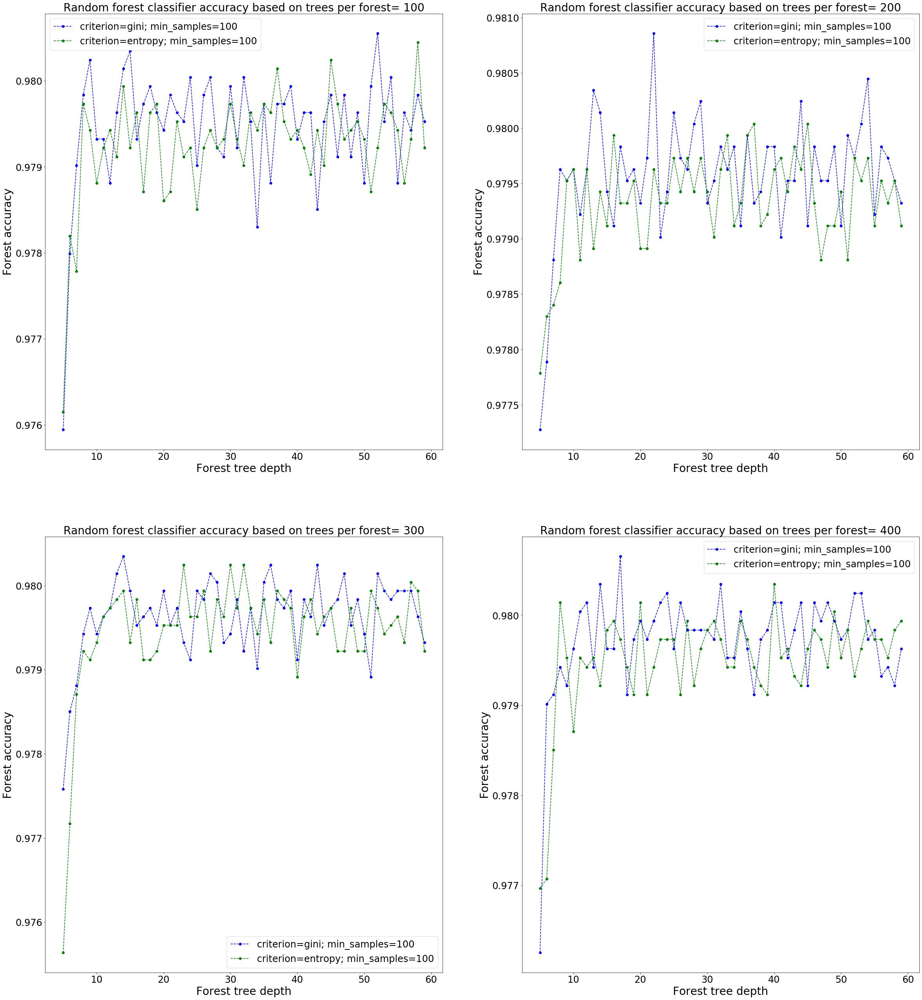

In [55]:
random_forrests = train_rf(X_train, Y_train, X_test, Y_test, figure_size, depth)

#### Findings

The same could be said for the random tree classifier, it is better on average by 0.1% than the second data set, but this appears to oscillate a lot more.

### 4.4.3 Multi layer perceptron

C:\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


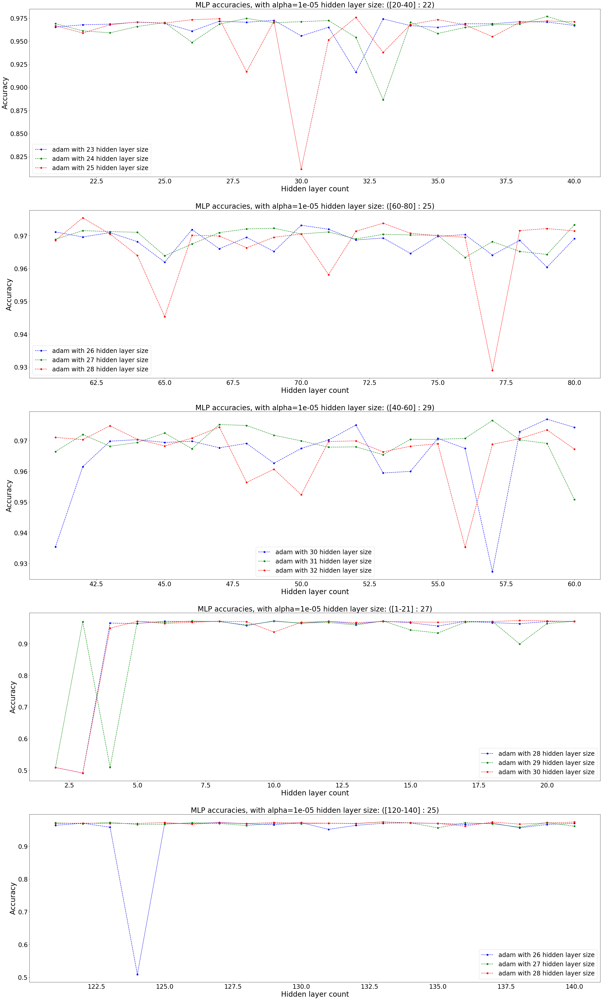

In [56]:
mlps = train_mlp(X_train, Y_train, X_test, Y_test, (40,70), alpha, hlsizes, hlcounts)

#### Findings

The accuracy of multi-layer perceptrons is quite similar to the second data subset, the accuracy difference is also quite the same, the biggest difference here is dips in accuracy, in the first 2 plots the dips are not that big, only 5% and overall there are way less of them, it is hard to say why, we think that it might have been due to more data helps mlps learn better.

### 4.4.4 Comparing classifiers

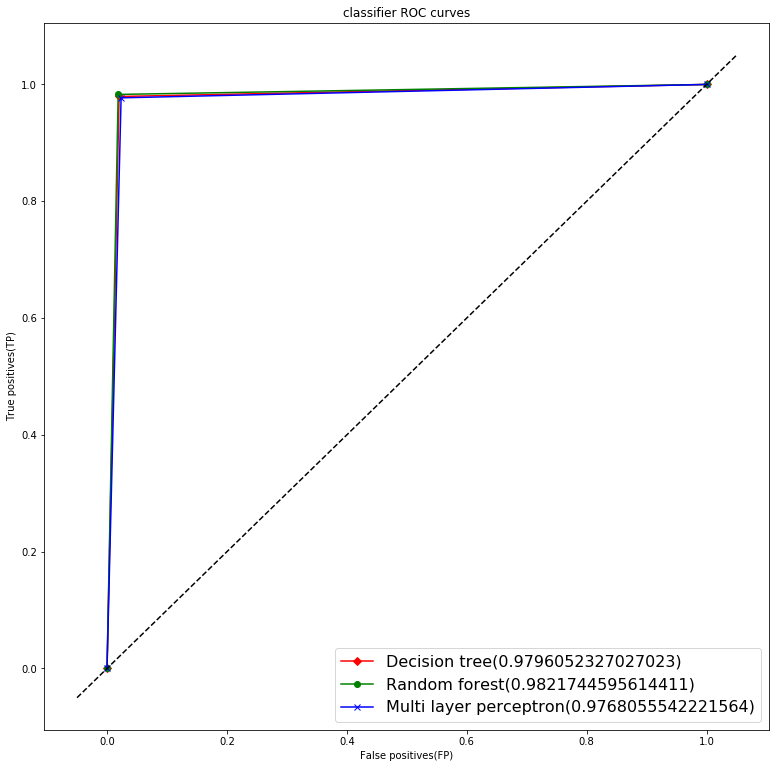

In [57]:
result = ClassifierResult(X4, Y4, decision_trees, random_forrests, mlps)
comparer = ClassifierComparer(result)

comparer.plot_top_classifier_roc_curves((13,13), True)

### 4.4.5 Ensemble classifier

In [66]:
# Saving decision tree as an png to look at.
# Passing None here, because the tree mainly uses only up to 24 features
result.get_best_preforming_dt().visualise_tree(None, classes, 'Tree4')

ensemble = MyEnsemble(result.get_best_preforming_dt(), result.get_best_preforming_rf(), result.get_best_preforming_mlp())
predictions = ensemble.predict(X4, normalize=True)

accuracy = metrics.accuracy_score(Y4, predictions)

print(accuracy)

0.9812251750542565


### 4.4.6 Testing real games

In [62]:
# reminder of the data columns:
#X4 = copy3_df[['gameDuration', 'firstBlood', 'firstTower', 'firstInhibitor', 'firstDragon', 'firstRiftHerald', 'firstBaron', 
#                               't1_towerKills', 't1_inhibitorKills', 't1_baronKills', 't1_dragonKills',
#                               't2_towerKills', 't2_inhibitorKills', 't2_baronKills', 't2_dragonKills',
#                               't1_champ1id', 't1_champ2id', 't1_champ3id', 't1_champ4id', 't1_champ5id',
#                               't2_champ1id', 't2_champ2id', 't2_champ3id', 't2_champ4id', 't2_champ5id']]

# parse champion to champ_id
cs = get_champions("Data/champion_info_2.json")

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343487193/24727655?tab=overview
t1_x = [1541, 2, 2, 2, 2, 2, 2,
        0, 0, 0, 1,
        8, 1, 1, 3,
        get_champion_id(cs, 'Darius'),get_champion_id(cs, 'Xerath'),get_champion_id(cs, 'Gragas'),
        get_champion_id(cs, 'Ashe'),get_champion_id(cs, 'Thresh'),
        get_champion_id(cs, 'Blitzcrank'),get_champion_id(cs, 'Mordekaiser'),get_champion_id(cs, 'Malzahar'),
        get_champion_id(cs, 'Vayne'),get_champion_id(cs, 'Vi')]
t1_y = 2

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4343503834/24727655?tab=overview
t2_x = [2251, 2, 1, 2, 2, 0, 2,
        4, 0, 0, 2,
        11, 6, 3, 4,
        get_champion_id(cs, 'Twitch'),get_champion_id(cs, 'Rengar'),get_champion_id(cs, 'Yasuo'),
        get_champion_id(cs, 'Graves'),get_champion_id(cs, 'Varus'),
        get_champion_id(cs, 'Zed'),get_champion_id(cs, 'Kayn'),get_champion_id(cs, 'Xayah'),
        get_champion_id(cs, 'Ryze'),get_champion_id(cs, 'Nautilus')]
t2_y = 2

# https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4340612643/2098439705481600?tab=overview
t3_x = [1613, 2, 1, 2, 2, 2, 2,
        2, 0, 0, 0,
        11, 4, 1, 3,
        get_champion_id(cs, 'Tristana'),get_champion_id(cs, 'Ashe'),get_champion_id(cs, 'Zed'),
        get_champion_id(cs, "Illaoi"),get_champion_id(cs, 'Kayn'),
        get_champion_id(cs, 'Tryndamere'),get_champion_id(cs, 'Viktor'),get_champion_id(cs, 'Shaco'),
        get_champion_id(cs, 'Caitlyn'),get_champion_id(cs, 'Nautilus')]
t3_y = 2

#https://matchhistory.euw.leagueoflegends.com/en/#match-details/EUW1/4333813733/229940470?tab=overview
t4_x = [2623, 1, 1, 1, 2, 1, 1,
        10, 3, 1, 5,
        4, 0, 0, 2,
        get_champion_id(cs, 'Ryze'),get_champion_id(cs, 'Morgana'),get_champion_id(cs, 'Tristana'),
        get_champion_id(cs, "Kha'Zix"),get_champion_id(cs, 'Renekton'),
        get_champion_id(cs, 'Karthus'),get_champion_id(cs, 'Yasuo'),get_champion_id(cs, 'Miss Fortune'),
        get_champion_id(cs, 'Nautilus'),get_champion_id(cs, 'Volibear')]
t4_y = 1

test_x = np.array([t1_x, t2_x, t3_x, t4_x])
test_y = np.array([t1_y, t2_y, t3_y, t4_y])

predictions = ensemble.predict(test_x, normalize=True)

for i in range(4):
    print("Test " + str(i+1) +". predicted is " + str(predictions[i]) + " and actual value is " + str(test_y[i]))

Test 1. predicted is 2 and actual value is 2
Test 2. predicted is 2 and actual value is 2
Test 3. predicted is 2 and actual value is 2
Test 4. predicted is 1 and actual value is 1


## Findings from the fourth subset

The results are similar to the second data set, the accuracy is around 98%. It looks like specific champions don't have that big of an impact on the game compared to taking objectives, which mostly require teamwork. The biggest difference here is the training time, even decision trees take a couple of minutes, and the multi layer perceptron took more than 40 minutes to train and being very deep it still provides slightly worse results than decision trees and random forests.

## 4.5 Conclusion

We can conclude that that the best subset was the 4th, that had the most data, meaning quality is really important in data mining, but not as important as picking the right data. Because comparing the accuracy and training time ratio, it does not look appealing. Training the second subset of data took around ~30 minutes, while training the 4th data set took more than an hour, while the accuracy gain is ~0.1-0.2%. For a game outcome prediction in our opinion 98% is better and the second subset of attributes is good enough.


We can also see, that single decision trees are quite well performing in our problem and even outperforms multi-layer perceptron. Although the random forests stands on top as the best classifier for our problem, not only it had the higher accuracy on all subsets of attributes, but it shined especially well regarding 3rd subset of data.

# 5. Predicting the meta

## 5.1 Constructing data

In [33]:
cs = get_champions("Data/champion_info_2.json")
figure_size = (40,45)
alpha = 1e-5
X5 = X3.copy()

X5['t1_champ1id'] = X5['t1_champ1id'].apply(lambda x: get_champion_tag(cs, x))
X5['t1_champ2id'] = X5['t1_champ2id'].apply(lambda x: get_champion_tag(cs, x))
X5['t1_champ3id'] = X5['t1_champ3id'].apply(lambda x: get_champion_tag(cs, x))
X5['t1_champ4id'] = X5['t1_champ4id'].apply(lambda x: get_champion_tag(cs, x))
X5['t1_champ5id'] = X5['t1_champ5id'].apply(lambda x: get_champion_tag(cs, x))

X5['t2_champ1id'] = X5['t2_champ1id'].apply(lambda x: get_champion_tag(cs, x))
X5['t2_champ2id'] = X5['t2_champ2id'].apply(lambda x: get_champion_tag(cs, x))
X5['t2_champ3id'] = X5['t2_champ3id'].apply(lambda x: get_champion_tag(cs, x))
X5['t2_champ4id'] = X5['t2_champ4id'].apply(lambda x: get_champion_tag(cs, x))
X5['t2_champ5id'] = X5['t2_champ5id'].apply(lambda x: get_champion_tag(cs, x))
Y5 = Y3

X_train, X_test, Y_train, Y_test = train_test_split(X5, Y5, test_size=0.2)
X5.sample(5)

,t1_champ1id,t1_champ2id,t1_champ3id,t1_champ4id,t1_champ5id,t2_champ1id,t2_champ2id,t2_champ3id,t2_champ4id,t2_champ5id
7611,1,0,2,1,3,0,3,3,0,5
5354,0,1,5,3,0,3,2,0,4,3
4246,0,3,1,0,4,0,1,0,1,3
39995,3,3,5,1,0,5,4,1,3,0
37793,3,0,1,0,5,1,1,1,0,3


## 5.2 Training model

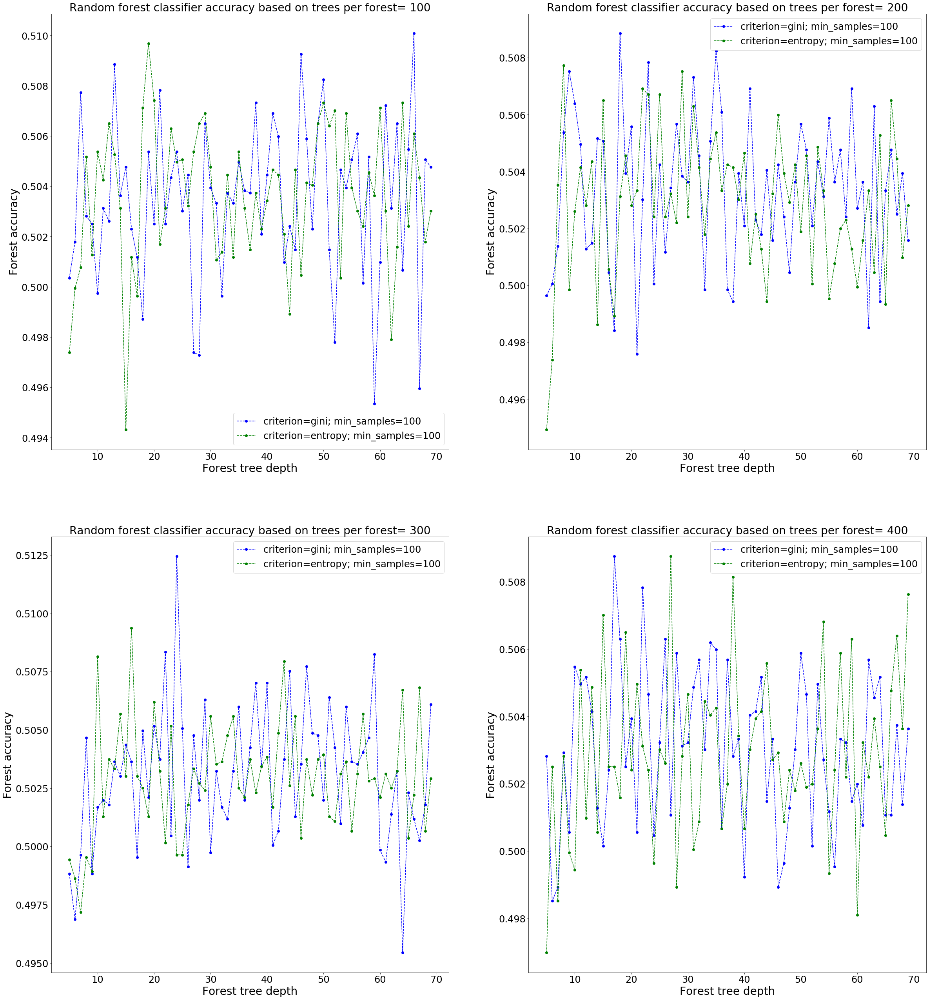

In [38]:
random_forrests = train_rf(X_train, Y_train, X_test, Y_test, figure_size, 70)

## 5.3 Finding out the the meta

In [42]:
ls = [i.get_accuracy() for i in random_forrests]
index = get_max_index(ls)
print(random_forrests[index].get_accuracy())

0.5124373016685434


## Conclusions
The accuracy of the model is around 50%, meaning it did not learn anything from the data. So determining the meta is not possible, I have tried using MLP's, but they fail to converge and the training time is very long. 